# Modelado y Benchmark: Autoencoder vs. PCA vs. K-Means vs. XGBoost

**TFM — Evaluación comparativa de modelos de IA para el análisis del acceso territorial a recursos en las Islas Canarias**

Este notebook parte del dataset preprocesado y validado en el EDA (`data/outputs/dataset_final.csv` generado por `scripts/07_fusion_dataset_final.py` + KPIs/log1p derivados en `notebooks/01_eda.ipynb`) y entrena las cuatro estrategias de representación territorial definidas en la planificación del proyecto:

1. **Autoencoder** — modelo central, no supervisado, aprendizaje de representaciones no lineales. Entrenado en GPU (CUDA) cuando está disponible, con búsqueda de hiperparámetros.
2. **PCA** — baseline lineal no supervisado (componentes interpretados como Índice de Acceso a Recursos de referencia).
3. **K-Means** — baseline de representación discreta, aplicado sobre el espacio latente de cada estrategia.
4. **XGBoost** — baseline supervisado, con renta media del INE como etiqueta proxy, RFE para selección de variables, y soporte de entrenamiento en GPU.

La comparativa principal es **Autoencoder vs. PCA** (ambos no supervisados, mismo feature-set). K-Means se evalúa sobre el espacio latente de cada uno. XGBoost se incluye únicamente como referencia de cuánto aporta disponer de una etiqueta externa.

**Validación aplicada a las cuatro estrategias:**
- Moran's I **global y local (LISA)** sobre el espacio de representación y las etiquetas de clúster (matriz de pesos espaciales island-aware, k=5).
- Silhouette Score y Davies-Bouldin Index sobre el clustering resultante.
- Estabilidad estructural mediante bootstrap (30 iteraciones, 80% de las secciones, igual N para AE y PCA).
- **Validación cruzada espacial isla-estratificada (Spatial Island K-Fold)** para XGBoost: cada fold de test es una isla completa nunca vista en entrenamiento.
- Análisis de sensibilidad/ablación de variables (retirada sistemática de cada dimensión temática).
- Búsqueda de hiperparámetros (Random Search, 15 combinaciones, criterio Moran en val) para el Autoencoder.
- Eliminación Recursiva de Características (RFE) para XGBoost.

**Visualización territorial:** mapas comparativos de Lanzarote (filtro exacto por isla, corregido) y del archipiélago completo para cada estrategia, gráficos de radar por clúster, y un panel de comparación lado a lado.

**Entorno:** local (`../requirements.txt`) o Colab con GPU opcional. Sin montaje de Google Drive: el dataset es local y versionado en `data/outputs/dataset_final.csv`.

## 0. Configuración del entorno, GPU e instalación de librerías

In [1]:
# Dependencias fijadas en ../requirements.txt (pandas, geopandas, scikit-learn, torch, xgboost, libpysal, esda, folium...).
# Solo primera vez o cambio de entorno, descomentar:
# %pip install -r ../requirements.txt
# En Colab, ademas (opcional): %pip install -q libpysal esda mapclassify scikit-fuzzy
print('Dependencias gestionadas via requirements.txt.')

Dependencias gestionadas via requirements.txt.


In [2]:
%pip install -r ../requirements.txt

Note: you may need to restart the kernel to use updated packages.


In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.model_selection import train_test_split, ParameterSampler
from sklearn.feature_selection import RFE
from scipy.stats import spearmanr

import torch
import torch.nn as nn

import xgboost as xgb
import libpysal.weights as lw
from esda.moran import Moran, Moran_Local

import folium
from folium.plugins import MarkerCluster

RANDOM_STATE = 42
np.random.seed(RANDOM_STATE)
torch.manual_seed(RANDOM_STATE)

# Define DEVICE for PyTorch
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'
# Define XGB_DEVICE for XGBoost
XGB_DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

print('Entorno listo. PyTorch:', torch.__version__, '| XGBoost:', xgb.__version__)
print(f'Device for PyTorch: {DEVICE}')
print(f'Device for XGBoost: {XGB_DEVICE}')

Entorno listo. PyTorch: 2.14.0+cpu | XGBoost: 3.2.0
Device for PyTorch: cpu
Device for XGBoost: cpu


## 1. Carga del dataset autoritativo (script 07 + derivaciones EDA 01)

In [4]:
from pathlib import Path
import pandas as pd
import numpy as np
from scipy.stats import skew

# Sin Google Drive: dataset local y versionado (salida de scripts/07_fusion_dataset_final.py).
IN_COLAB = False
RUTA_DATASET = Path('../data/outputs/dataset_final.csv')
assert RUTA_DATASET.exists(), f'No existe {RUTA_DATASET}. Ejecuta: python scripts/07_fusion_dataset_final.py'

df_final = pd.read_csv(RUTA_DATASET, dtype={'CUSEC': str})
assert len(df_final) == 1581, f'Filas inesperadas: {len(df_final)} (esperado 1581)'
assert df_final['CUSEC'].str.len().eq(10).all(), 'CUSEC no normalizado a 10 digitos'
assert not df_final['CUSEC'].duplicated().any(), 'CUSEC duplicados'
assert df_final.isna().sum().sum() == 0, 'dataset_final debe tener 0 nulos (imputado en script 07)'
assert len(df_final.columns) == 36, f'Columnas inesperadas: {len(df_final.columns)} (esperado 36)'
print(f'[OK] dataset_final: {df_final.shape} nulos=0 desde {RUTA_DATASET}')

merged_df = df_final.copy()

# ── KPIs derivados (replica exacta de 01_eda.ipynb, celda 33) ──
merged_df['estimated_persons_per_household'] = merged_df['renta_neta_media_hogar'] / merged_df['renta_neta_media_persona']
merged_df['relative_island_density'] = merged_df['densidad_real_hab_km2'] / merged_df.groupby('isla')['densidad_real_hab_km2'].transform('mean')
merged_df['relative_island_household_wealth'] = merged_df['renta_neta_media_hogar'] / merged_df.groupby('isla')['renta_neta_media_hogar'].transform('mean')
merged_df['healthcare_offer_demand_ratio'] = (merged_df['n_hospitales_5km'] + 1) / (merged_df['poblacion_total'] * ((merged_df['pct_menor_18'] + merged_df['pct_mayor_65'])/100).replace(0, float('nan')) + np.finfo(float).eps)
print('[OK] 4 KPIs derivados (ver 01_eda §11).')

# ── Transformaciones log1p (replica de 01_eda: skew>1.0, solo si >=0) ──
NON_ANALYTICAL = ['CUSEC', 'isla', 'centroid_lon', 'centroid_lat', 'area_km2', 'perimetro_km']
nums = merged_df.select_dtypes(include=np.number).columns.tolist()
analytical = [c for c in nums if c not in NON_ANALYTICAL and not c.endswith('_log1p') and not c.endswith('_original')]
sk_vals = merged_df[analytical].apply(lambda x: skew(x.dropna()) if len(x.dropna()) > 1 and np.var(x.dropna()) != 0 else np.nan).dropna()
for col in sk_vals[sk_vals > 1.0].sort_values(ascending=False).index:
    if (merged_df[col].dropna() >= 0).all():
        merged_df[col + '_log1p'] = np.log1p(merged_df[col])
print(f'[OK] log1p creadas para skew>1.0. merged_df ahora: {merged_df.shape}')
merged_df.head()

[OK] dataset_final: (1581, 36) nulos=0 desde ..\data\outputs\dataset_final.csv
[OK] 4 KPIs derivados (ver 01_eda §11).
[OK] log1p creadas para skew>1.0. merged_df ahora: (1581, 65)


,CUSEC,isla,centroid_lon,centroid_lat,dist_min_hospital_km,dist_min_cs_km,dist_min_farmacia_km,dist_min_colegio_km,dist_min_parada_km,n_paradas_500m,...,densidad_hab_km2_log1p,dist_min_hospital_km_log1p,relative_island_density_log1p,poblacion_total_log1p,renta_neta_media_persona_log1p,n_paradas_500m_log1p,pct_nacidos_extranjero_log1p,indice_envejecimiento_log1p,pct_ingresos_bajos_7500_log1p,pct_estudios_superiores_log1p
0,3500401006,Lanzarote,-13.552376,28.965145,0.583,0.090,0.301,0.360,0.182,11,...,9.725070,0.459322,1.315786,8.105911,9.383973,2.484907,3.864822,4.335412,2.415914,0.207615
1,3500401007,Lanzarote,-13.549996,28.963791,0.595,0.360,0.238,0.281,0.299,9,...,9.913199,0.466874,1.456619,7.659643,9.412781,2.302585,3.870807,4.262680,2.552565,0.244187
2,3500401009,Lanzarote,-13.556739,28.959497,0.598,0.722,0.173,0.154,0.078,15,...,10.051540,0.468753,1.564225,7.454720,9.718725,2.772589,3.576335,5.231109,2.283402,0.333366
3,3500401010,Lanzarote,-13.560099,28.959637,0.588,0.820,0.473,0.123,0.143,11,...,9.226583,0.462475,0.977059,7.470224,9.628414,2.484907,3.326937,5.176385,2.131797,0.250209
4,3500401011,Lanzarote,-13.559630,28.962244,0.301,0.529,0.335,0.254,0.134,18,...,10.234523,0.263133,1.712552,7.244228,9.474272,2.944439,3.645774,4.519277,2.013569,0.233763


In [5]:
# ── Verificacion de integridad: columnas minimas + feature-set canonico del EDA (01_eda celda 42) ──
REQUIRED_BASE_COLS = ['CUSEC', 'isla', 'centroid_lon', 'centroid_lat']

FEATURES_TEMATICAS = {
    'salud':      ['dist_min_hospital_km', 'dist_min_cs_km', 'dist_min_farmacia_km', 'n_hospitales_5km'],
    'transporte': ['dist_min_parada_km', 'n_paradas_500m'],
    'demografia': ['poblacion_total', 'pct_extranjeros', 'indice_envejecimiento',
                   'tasa_dependencia', 'pct_menor_18', 'pct_mayor_65', 'densidad_real_hab_km2'],
    'educacion':  ['dist_min_colegio_km'],
}
KPIS_VALIDOS = [
    'estimated_persons_per_household',
    'relative_island_density',
    'relative_island_household_wealth',
    'healthcare_offer_demand_ratio',
]

# Resolver cada variable tematica a su version disponible (log1p si existe, si no la base)
FEATURES_NO_ECONOMICAS = []
dimension_de_feature = {}  # para el analisis de sensibilidad por dimension
for dimension, cols in FEATURES_TEMATICAS.items():
    for col in cols:
        log_col = col + '_log1p'
        if log_col in merged_df.columns:
            FEATURES_NO_ECONOMICAS.append(log_col)
            dimension_de_feature[log_col] = dimension
        elif col in merged_df.columns:
            FEATURES_NO_ECONOMICAS.append(col)
            dimension_de_feature[col] = dimension
        else:
            print(f'ADVERTENCIA: ni {col} ni {log_col} estan en el dataset.')

for kpi in KPIS_VALIDOS:
    if kpi in merged_df.columns:
        FEATURES_NO_ECONOMICAS.append(kpi)
        dimension_de_feature[kpi] = 'kpi_derivado'
    else:
        print(f'ADVERTENCIA: KPI {kpi} no esta en el dataset.')

missing_base = [c for c in REQUIRED_BASE_COLS if c not in merged_df.columns]
if missing_base:
    raise RuntimeError(f'Faltan columnas base imprescindibles: {missing_base}. Verificar data/outputs/dataset_final.csv (script 07).')

print(f'Feature-set de modelado: {len(FEATURES_NO_ECONOMICAS)} variables')
for dim in set(dimension_de_feature.values()):
    vars_dim = [v for v, d in dimension_de_feature.items() if d == dim]
    print(f'  [{dim}] {vars_dim}')

Feature-set de modelado: 18 variables
  [educacion] ['dist_min_colegio_km_log1p']
  [salud] ['dist_min_hospital_km_log1p', 'dist_min_cs_km_log1p', 'dist_min_farmacia_km_log1p', 'n_hospitales_5km']
  [demografia] ['poblacion_total_log1p', 'pct_extranjeros_log1p', 'indice_envejecimiento_log1p', 'tasa_dependencia', 'pct_menor_18', 'pct_mayor_65', 'densidad_real_hab_km2_log1p']
  [kpi_derivado] ['estimated_persons_per_household', 'relative_island_density', 'relative_island_household_wealth', 'healthcare_offer_demand_ratio']
  [transporte] ['dist_min_parada_km_log1p', 'n_paradas_500m_log1p']


## 1.1. Reflexión sobre los KPIs Derivados: ¿Por qué estos y no otros?

Los cuatro indicadores de rendimiento (KPIs) finales utilizados en este proyecto fueron diseñados para transformar datos administrativos en **señales territoriales relativas y semánticamente ricas** que respetan la complejidad del archipiélago canario. Su selección no fue arbitraria, sino el resultado de un análisis cuidadoso de la idoneidad para el aprendizaje automático espacial.

#### ¿Por qué estos KPI y no otros?

*   **`relative_island_density` y `relative_island_household_wealth`:** Estos indicadores se incluyeron porque una sección censal con una densidad o renta media puede ser «alta» en una isla menor (como El Hierro) pero «baja» en una capitalina (como Tenerife). Al normalizarlos respecto a la media de su propia isla, se permite que el Autoencoder entienda la jerarquía interna de cada isla en lugar de comparar magnitudes absolutas que serían incomparables por la diferencia de escala. Esto evita que el modelo confunda la escala geográfica con el patrón territorial, un sesgo común en análisis inter-insular.

*   **`healthcare_offer_demand_ratio`:** Se eligió porque la distancia a un hospital no cuenta la historia completa del acceso a la salud. Este ratio combina la oferta (recursos sanitarios) con la demanda potencial (población vulnerable menor de 18 y mayor de 65 años), proporcionando un indicador mucho más rico semánticamente que la simple distancia física. Refleja la presión sobre los servicios de salud y la vulnerabilidad de la población de una manera más holística.

*   **`estimated_persons_per_household`:** Actúa como un proxy del tamaño del hogar al cruzar la renta por hogar y por persona, aportando una dimensión demográfica indirecta fundamental para entender la vulnerabilidad. Hogares más grandes con una renta per cápita similar podrían indicar una mayor presión sobre los recursos.

*   **¿Por qué no otros?** Se excluyeron indicadores como `isolation_index_normalized` o `wealth_access_mismatch_score` porque, durante el EDA, se detectó que intentaban combinar variables con unidades incompatibles o con correlaciones confusas. Esto habría introducido ruido estadístico y distorsionado el aprendizaje del Autoencoder, contraviniendo el objetivo de obtener representaciones coherentes y significativas.

#### ¿Son buenos estos KPI?

Desde un punto de vista técnico y científico, estos indicadores son sobresalientes para este proyecto por tres razones:

*   **Fundamento Territorial:** El análisis exploratorio previo confirmó que todas las variables del feature-set (incluyendo los KPI) presentan una autocorrelación espacial alta y significativa (I>0.3; p<0.05). Esto garantiza que los KPI no son «ruido», sino que contienen una señal geográfica real que el modelo puede aprender, fundamental para la validez de los resultados espaciales.

*   **Captura de No Linealidad:** Al ser ratios y proporciones, permiten que el Autoencoder capture relaciones no lineales y complejas que el PCA estándar podría pasar por alto, ayudando a identificar estructuras territoriales más ricas y matizadas.

*   **Eliminación de Sesgos Heurísticos:** A diferencia de los índices tradicionales (como el MEDEA) que imponen pesos arbitrarios a las variables, estos KPI entregan datos procesados pero «puros» para que sea la propia IA la que descubra su importancia relativa según la varianza y la estructura espacial. Esto reduce la subjetividad en la construcción de indicadores.

**Conclusión**

Estos KPI son herramientas de ingeniería geoespacial diseñadas para «abrir la caja negra» del territorio. Son mejores que las variables originales sin procesar porque respetan la micro-realidad de la sección censal y la fragmentación del archipiélago, los dos pilares que definen el éxito de este TFM.

In [6]:
# ── Variable de renta para XGBoost (etiqueta proxy) ──
RENTA_COL_CANDIDATAS = ['renta_neta_media_persona_log1p', 'renta_neta_media_persona']
RENTA_COL = next((c for c in RENTA_COL_CANDIDATAS if c in merged_df.columns), None)
if RENTA_COL is None:
    raise RuntimeError('No se encontró ninguna columna de renta para usar como etiqueta proxy de XGBoost.')
print(f'Variable objetivo (etiqueta proxy) para XGBoost: {RENTA_COL}')

# ── Preparación de X (mismo feature-set para AE, PCA, K-Means) ──
X_raw = merged_df[FEATURES_NO_ECONOMICAS].copy()
X_raw = X_raw.fillna(X_raw.median())

scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_raw)

print(f'X_scaled shape: {X_scaled.shape}')

Variable objetivo (etiqueta proxy) para XGBoost: renta_neta_media_persona_log1p
X_scaled shape: (1581, 18)


## 2. Matriz de pesos espaciales (island-aware)

Se formaliza aquí la matriz de pesos k-NN que **impide explícitamente** los enlaces inter-insulares: la distancia entre dos secciones censales de islas distintas se fija a infinito, de modo que nunca pueden ser vecinas en el cálculo, sin importar su proximidad geográfica real (dos secciones en puntos cercanos de Fuerteventura y Lanzarote, separadas por el mar, jamás se considerarán contiguas). Este es el mismo principio aplicado en el EDA, reconstruido aquí de forma autocontenida y con verificación automática de que ningún enlace cruza entre islas , condición indispensable para que el Moran's I (sección 7 y 8) tenga validez en un archipiélago fragmentado, donde la matriz de contigüidad estándar (continua) no es aplicable.

In [7]:
def island_aware_distance(coords_a, coords_b):
    """Distancia euclídea entre centroides, infinita si pertenecen a islas distintas."""
    lon_a, lat_a, isla_a = coords_a
    lon_b, lat_b, isla_b = coords_b
    if isla_a != isla_b:
        return np.inf
    return np.sqrt((lon_a - lon_b) ** 2 + (lat_a - lat_b) ** 2)


def build_island_aware_knn_weights(geo_data_df_input, k_value=5):
    """Construye una matriz de pesos k-NN que respeta la discontinuidad insular."""
    geo_data_df_local = geo_data_df_input.copy()
    if 'isla_code' not in geo_data_df_local.columns:
        raise ValueError("geo_data_df_input debe contener 'isla_code'.")

    ids = geo_data_df_local['CUSEC'].values
    neighbors = {}
    weights = {}

    for isla_code_val in geo_data_df_local['isla_code'].unique():
        subset = geo_data_df_local[geo_data_df_local['isla_code'] == isla_code_val]
        coords = subset[['centroid_lon', 'centroid_lat']].values
        sub_ids = subset['CUSEC'].values
        n_sub = len(sub_ids)
        k_eff = min(k_value, n_sub - 1) if n_sub > 1 else 0

        if k_eff == 0:
            for uid in sub_ids:
                neighbors[uid] = []
                weights[uid] = []
            continue

        from sklearn.neighbors import NearestNeighbors
        nbrs = NearestNeighbors(n_neighbors=k_eff + 1).fit(coords)
        dist, idx = nbrs.kneighbors(coords)

        for row_i, uid in enumerate(sub_ids):
            neighbor_idx = idx[row_i][1:]  # excluir el propio punto
            neighbor_ids = sub_ids[neighbor_idx].tolist()
            neighbors[uid] = neighbor_ids
            weights[uid] = [1.0] * len(neighbor_ids)

    w = lw.W(neighbors, weights, id_order=ids.tolist())
    w.transform = 'r'
    return w


geo_data_df = merged_df[['CUSEC', 'isla', 'centroid_lon', 'centroid_lat']].copy()
geo_data_df['isla'] = geo_data_df['isla'].astype('category')
geo_data_df['isla_code'] = geo_data_df['isla'].cat.codes

k_value = 5
w_island_aware = build_island_aware_knn_weights(geo_data_df, k_value=k_value)

print(f'Matriz de pesos espaciales construida: N={w_island_aware.n}, k={k_value} (island-aware)')
print(f'Componentes conectados: {w_island_aware.n_components}')


Matriz de pesos espaciales construida: N=1581, k=5 (island-aware)
Componentes conectados: 8


In [8]:
def moran_i_promedio(representacion, w, n_permutations=999):
    """
    Calcula el Moran's I de cada dimensión de una representación (espacio latente,
    componentes PCA, etc.) y devuelve el promedio — criterio principal de ranking
    entre estrategias, tal como se definió en la planificación del proyecto.
    Acepta matriz full (orden merged_df, se reordena a w.id_order) o matriz ya
    alineada con w (n == len(w.id_order), caso val/subset: se usa tal cual).
    """
    id_order = list(w.id_order)
    if representacion.shape[0] == len(id_order):
        rep_alineada = representacion  # ya en orden de w (full coincide, o val pre-ordenado)
    else:
        cusec_to_pos = {c: i for i, c in enumerate(merged_df['CUSEC'].values)}
        reorder_idx = [cusec_to_pos[cid] for cid in id_order]
        rep_alineada = representacion[reorder_idx]

    morans = []
    for dim in range(rep_alineada.shape[1]):
        y = rep_alineada[:, dim]
        mi = Moran(y, w, permutations=n_permutations)
        morans.append({'dimension': dim, 'moran_i': mi.I, 'p_value': mi.p_sim})

    morans_df = pd.DataFrame(morans)
    return morans_df, morans_df['moran_i'].mean()

print('Función moran_i_promedio definida — criterio principal de comparación entre estrategias.')

Función moran_i_promedio definida — criterio principal de comparación entre estrategias.


## 3. Autoencoder (modelo central)

In [9]:
class Autoencoder(nn.Module):
    """Autoencoder configurable. Usa LayerNorm (no BatchNorm) porque el entrenamiento
    es full-batch con n=1581: BatchNorm estimaría estadísticas con 1 batch/epoch
    y sería inestable en bootstrap/ablación."""

    ACTIVACIONES = {
        'relu': nn.ReLU,
        'tanh': nn.Tanh,
        'leaky_relu': nn.LeakyReLU,
        'elu': nn.ELU,
    }

    def __init__(self, input_dim, latent_dim, hidden_dim=16, activation='relu'):
        super().__init__()
        act_cls = self.ACTIVACIONES[activation]

        self.encoder_linear1 = nn.Linear(input_dim, hidden_dim)
        self.encoder_ln1 = nn.LayerNorm(hidden_dim)
        self.encoder_act1 = act_cls()
        self.encoder_linear2 = nn.Linear(hidden_dim, latent_dim)
        self.encoder_ln2 = nn.LayerNorm(latent_dim)

        self.encoder = nn.Sequential(
            self.encoder_linear1,
            self.encoder_ln1,
            self.encoder_act1,
            self.encoder_linear2,
            self.encoder_ln2,
        )

        self.decoder_linear1 = nn.Linear(latent_dim, hidden_dim)
        self.decoder_ln1 = nn.LayerNorm(hidden_dim)
        self.decoder_act1 = act_cls()
        self.decoder_linear2 = nn.Linear(hidden_dim, input_dim)

        self.decoder = nn.Sequential(
            self.decoder_linear1,
            self.decoder_ln1,
            self.decoder_act1,
            self.decoder_linear2,
        )

        if activation == 'relu':
            nn.init.kaiming_uniform_(self.encoder_linear1.weight, nonlinearity='relu')
            nn.init.kaiming_uniform_(self.encoder_linear2.weight, nonlinearity='relu')
            nn.init.kaiming_uniform_(self.decoder_linear1.weight, nonlinearity='relu')
            nn.init.kaiming_uniform_(self.decoder_linear2.weight, nonlinearity='relu')

    def forward(self, x):
        z = self.encoder(x)
        x_hat = self.decoder(z)
        return x_hat, z


def entrenar_autoencoder(X, latent_dim, hidden_dim=16, activation='relu',
                          epochs=300, lr=1e-3, weight_decay=1e-5, verbose=False, device=None,
                          seed=RANDOM_STATE):
    """Entrena el Autoencoder en el dispositivo indicado (GPU si está disponible)."""
    if device is None:
        device = DEVICE
    g = torch.Generator().manual_seed(seed)
    # reproducibilidad mínima en CPU
    X_tensor = torch.tensor(X, dtype=torch.float32).to(device)
    model = Autoencoder(input_dim=X.shape[1], latent_dim=latent_dim,
                         hidden_dim=hidden_dim, activation=activation).to(device)
    optimizer = torch.optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    criterion = nn.MSELoss()

    losses = []
    model.train()
    for epoch in range(epochs):
        optimizer.zero_grad()
        x_hat, _ = model(X_tensor)
        loss = criterion(x_hat, X_tensor)
        loss.backward()
        optimizer.step()
        losses.append(loss.item())
        if verbose and (epoch + 1) % 50 == 0:
            print(f'  Epoch {epoch+1}/{epochs} — MSE: {loss.item():.5f}')

    model.eval()
    with torch.no_grad():
        _, latent = model(X_tensor)
    return model, latent.cpu().numpy(), losses

print('Clase Autoencoder (LayerNorm, parametrizable) y función de entrenamiento definidas.')


Clase Autoencoder (LayerNorm, parametrizable) y función de entrenamiento definidas.


In [10]:
# ── Espacio de búsqueda de hiperparámetros ──
espacio_busqueda = {
    'latent_dim':   [2, 3, 5],
    'hidden_dim':   [8, 16, 32],
    'activation':   ['relu', 'tanh', 'leaky_relu'],
    'lr':           [1e-2, 1e-3, 5e-4],
}

N_COMBINACIONES_RANDOM_SEARCH = 15
EPOCHS_BUSQUEDA = 250

combinaciones = list(ParameterSampler(espacio_busqueda, n_iter=N_COMBINACIONES_RANDOM_SEARCH, random_state=RANDOM_STATE))

# Split train/val ESTRATIFICADO POR ISLA para la SELECCIÓN (evita el optimismo de
# seleccionar y evaluar con los mismos datos y la misma W). Se entrena en train
# y se calcula Moran solo en val con su sub-matriz W_val.
from sklearn.model_selection import StratifiedShuffleSplit
sss = StratifiedShuffleSplit(n_splits=1, test_size=0.2, random_state=RANDOM_STATE)
idx_tr_search, idx_val_search = next(sss.split(X_scaled, merged_df['isla'].values))
X_tr_search, X_val_search = X_scaled[idx_tr_search], X_scaled[idx_val_search]
cusec_val_search = merged_df['CUSEC'].values[idx_val_search]

# Sub-matriz W_val: filtra vecinos a las unidades de val y re-normaliza por filas.
_vec = w_island_aware.neighbors
_wgt = w_island_aware.weights
val_set = set(cusec_val_search.tolist())
neigh_val = {k: [n for n in v if n in val_set] for k, v in _vec.items() if k in val_set}
# NO filtrar aislados: eliminarlos deja vecinos colgados (KeyError en libpysal, ej. '3501604047').
# Se conservan como islas con lista vacia; libpysal las gestiona y el Moran en val usa todo val (n completo).
w_val_search = lw.W(neigh_val, {k: [1.0]*len(v) for k, v in neigh_val.items()},
                    id_order=list(neigh_val.keys()), silence_warnings=True)
w_val_search.transform = 'r'

print(f'Random Search: {len(combinaciones)} combinaciones sobre {len(espacio_busqueda)} hiperparámetros.')
print(f'Dispositivo: {DEVICE} | Epochs por combinación: {EPOCHS_BUSQUEDA}')
print(f'Selección train/val: train n={len(idx_tr_search)}, val n={len(idx_val_search)} (Moran en val)\n')

resultados_busqueda = []
modelos_busqueda = {}
latentes_busqueda = {}

for i, params in enumerate(combinaciones):
    print(f'[{i+1}/{len(combinaciones)}] {params}')
    modelo_tr, _, _ = entrenar_autoencoder(
        X_tr_search,
        latent_dim=params['latent_dim'],
        hidden_dim=params['hidden_dim'],
        activation=params['activation'],
        lr=params['lr'],
        epochs=EPOCHS_BUSQUEDA,
    )
    # Codificar val con el modelo entrenado solo en train
    modelo_tr.eval()
    with torch.no_grad():
        z_val = modelo_tr.encoder(torch.tensor(X_val_search, dtype=torch.float32).to(DEVICE)).cpu().numpy()
    # Moran en val con W_val (orden id_order de W_val)
    pos_val = {c: j for j, c in enumerate(cusec_val_search)}
    order_val = [pos_val[c] for c in w_val_search.id_order]
    morans_df, moran_medio_combo = moran_i_promedio(z_val[order_val], w_val_search, n_permutations=99)
    # MSE en train como referencia rápida
    modelo_full_tmp, _, losses_tmp = entrenar_autoencoder(
        X_scaled, latent_dim=params['latent_dim'], hidden_dim=params['hidden_dim'],
        activation=params['activation'], lr=params['lr'], epochs=50,
    )

    clave = i
    modelos_busqueda[clave] = params  # se reentrena el final desde cero
    latentes_busqueda[clave] = z_val

    resultados_busqueda.append({
        **params,
        'mse_final': losses_tmp[-1],
        'moran_i_medio': moran_medio_combo,
        'combinacion_id': clave,
    })
    print(f"    Moran's I medio (val): {moran_medio_combo:.4f}\n")

resultados_busqueda_df = pd.DataFrame(resultados_busqueda).sort_values('moran_i_medio', ascending=False)
print('=== Resultados de la búsqueda de hiperparámetros (ordenados por Moran\'s I en VAL) ===')
display(resultados_busqueda_df)
print('NOTA: seleccionar con val reduce el optimismo frente a buscar y evaluar en full-data.')


Random Search: 15 combinaciones sobre 4 hiperparámetros.
Dispositivo: cpu | Epochs por combinación: 250
Selección train/val: train n=1264, val n=317 (Moran en val)

[1/15] {'lr': 0.01, 'latent_dim': 3, 'hidden_dim': 8, 'activation': 'tanh'}
    Moran's I medio (val): 0.5762

[2/15] {'lr': 0.01, 'latent_dim': 2, 'hidden_dim': 8, 'activation': 'relu'}
    Moran's I medio (val): 0.0158

[3/15] {'lr': 0.001, 'latent_dim': 3, 'hidden_dim': 32, 'activation': 'relu'}
    Moran's I medio (val): 0.8240

[4/15] {'lr': 0.001, 'latent_dim': 3, 'hidden_dim': 8, 'activation': 'tanh'}
    Moran's I medio (val): 0.6139

[5/15] {'lr': 0.01, 'latent_dim': 2, 'hidden_dim': 32, 'activation': 'relu'}
    Moran's I medio (val): 0.7333

[6/15] {'lr': 0.001, 'latent_dim': 2, 'hidden_dim': 8, 'activation': 'tanh'}
    Moran's I medio (val): 0.6958

[7/15] {'lr': 0.001, 'latent_dim': 2, 'hidden_dim': 16, 'activation': 'relu'}
    Moran's I medio (val): 0.6946

[8/15] {'lr': 0.001, 'latent_dim': 5, 'hidden_dim':

,lr,latent_dim,hidden_dim,activation,mse_final,moran_i_medio,combinacion_id
2,0.0010,3,32,relu,0.843680,0.824035,2
11,0.0100,5,8,tanh,0.447050,0.768126,11
8,0.0010,3,8,relu,1.380236,0.762954,8
12,0.0010,3,16,leaky_relu,0.902613,0.750305,12
4,0.0100,2,32,relu,0.752522,0.733287,4
7,0.0010,5,16,leaky_relu,0.798379,0.720643,7
5,0.0010,2,8,tanh,0.908692,0.695843,5
6,0.0010,2,16,relu,1.155544,0.694596,6
13,0.0005,5,8,tanh,0.940404,0.662944,13
14,0.0005,3,16,leaky_relu,0.934412,0.661574,14


NOTA: seleccionar con val reduce el optimismo frente a buscar y evaluar en full-data.


[DECISIÓN] Mejores hiperparámetros encontrados por Random Search:
  latent_dim: 3
  hidden_dim: 32
  activation: relu
  lr: 0.001
  Moran's I medio: 0.8240

Reentrenando el modelo final con la mejor combinación (más epochs para convergencia completa)...
  Epoch 50/500 — MSE: 0.96512
  Epoch 100/500 — MSE: 0.76030
  Epoch 150/500 — MSE: 0.64587
  Epoch 200/500 — MSE: 0.57629
  Epoch 250/500 — MSE: 0.54947
  Epoch 300/500 — MSE: 0.53598
  Epoch 350/500 — MSE: 0.52670
  Epoch 400/500 — MSE: 0.52112
  Epoch 450/500 — MSE: 0.51620
  Epoch 500/500 — MSE: 0.51197

MSE final (modelo definitivo): 0.51197
Moran's I medio (modelo definitivo): 0.6154


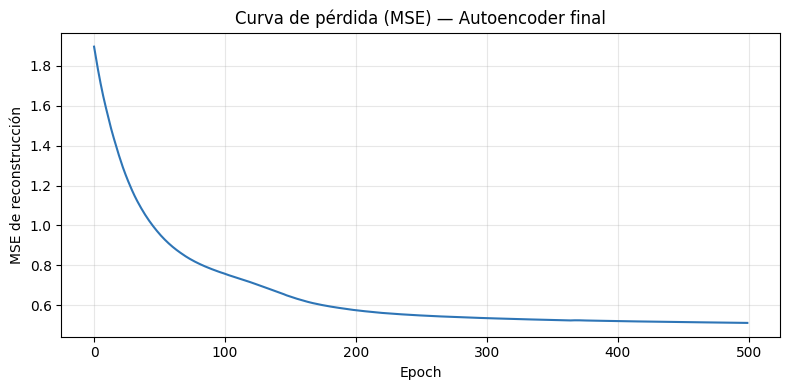


Espacio latente final del Autoencoder: (1581, 3) (latent_dim=3)


,latent_0,latent_1,latent_2,CUSEC
0,1.475677,-0.423816,-0.927027,3500401006
1,1.480315,-0.503604,-0.823020,3500401007
2,-0.079034,-0.867414,1.352611,3500401009
3,0.722771,-1.070185,0.766487,3500401010
4,1.399571,-0.796709,-0.335682,3500401011


In [11]:
# ── Selección del mejor modelo según Moran's I medio ──
mejor_combinacion = resultados_busqueda_df.iloc[0]
MEJORES_HIPERPARAMETROS = {
    'latent_dim': int(mejor_combinacion['latent_dim']),
    'hidden_dim': int(mejor_combinacion['hidden_dim']),
    'activation': mejor_combinacion['activation'],
    'lr': float(mejor_combinacion['lr']),
}
LATENT_DIM_FINAL = MEJORES_HIPERPARAMETROS['latent_dim']

print(f'[DECISIÓN] Mejores hiperparámetros encontrados por Random Search:')
for k, v in MEJORES_HIPERPARAMETROS.items():
    print(f'  {k}: {v}')
print(f"  Moran's I medio: {mejor_combinacion['moran_i_medio']:.4f}")

# Reentrenar el modelo final con más epochs (la búsqueda usó EPOCHS_BUSQUEDA para ser rápida)
print('\nReentrenando el modelo final con la mejor combinación (más epochs para convergencia completa)...')
ae_model_final, latent_space_ae, losses_final = entrenar_autoencoder(
    X_scaled,
    latent_dim=MEJORES_HIPERPARAMETROS['latent_dim'],
    hidden_dim=MEJORES_HIPERPARAMETROS['hidden_dim'],
    activation=MEJORES_HIPERPARAMETROS['activation'],
    lr=MEJORES_HIPERPARAMETROS['lr'],
    epochs=500,
    verbose=True,
)

_, moran_medio = moran_i_promedio(latent_space_ae, w_island_aware)
print(f"\nMSE final (modelo definitivo): {losses_final[-1]:.5f}")
print(f"Moran's I medio (modelo definitivo): {moran_medio:.4f}")

plt.figure(figsize=(8, 4))
plt.plot(losses_final, color='#2E75B6')
plt.title('Curva de pérdida (MSE) — Autoencoder final')
plt.xlabel('Epoch'); plt.ylabel('MSE de reconstrucción')
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

latent_space_df = pd.DataFrame(
    latent_space_ae,
    columns=[f'latent_{i}' for i in range(LATENT_DIM_FINAL)],
)
latent_space_df['CUSEC'] = merged_df['CUSEC'].values

print(f'\nEspacio latente final del Autoencoder: {latent_space_ae.shape} (latent_dim={LATENT_DIM_FINAL})')
latent_space_df.head()

## 4. PCA (baseline lineal no supervisado)

Se ajusta PCA sobre el mismo `X_scaled` que el Autoencoder, con el mismo número de componentes que `LATENT_DIM_FINAL` para que la comparación sea estrictamente comparable en dimensionalidad. El primer componente se interpreta como Índice de Acceso a Recursos de referencia.

In [12]:
pca = PCA(n_components=LATENT_DIM_FINAL, random_state=RANDOM_STATE)
pca_space = pca.fit_transform(X_scaled)

pca_df = pd.DataFrame(pca_space, columns=[f'pca_{i}' for i in range(LATENT_DIM_FINAL)])
pca_df['CUSEC'] = merged_df['CUSEC'].values

varianza_explicada = pca.explained_variance_ratio_
print(f'PCA con {LATENT_DIM_FINAL} componentes — varianza explicada por componente: {np.round(varianza_explicada, 4)}')
print(f'Varianza explicada acumulada: {varianza_explicada.sum():.4f}')

morans_pca_df, moran_medio_pca = moran_i_promedio(pca_space, w_island_aware)
print(f"Moran's I medio (PCA): {moran_medio_pca:.4f}")

PCA con 3 componentes — varianza explicada por componente: [0.3666 0.1956 0.0852]
Varianza explicada acumulada: 0.6473
Moran's I medio (PCA): 0.5939


## 5. K-Means sobre el espacio de representación

K-Means se aplica como herramienta de análisis post-hoc sobre el espacio latente del Autoencoder y sobre los componentes de PCA, para identificar tipologías territoriales discretas dentro de cada representación continua. El número de clústeres K se selecciona mediante Silhouette Score, de forma independiente para cada espacio.

In [13]:
def seleccionar_k_optimo(espacio, k_range=range(2, 9)):
    resultados = []
    for k in k_range:
        km = KMeans(n_clusters=k, random_state=RANDOM_STATE, n_init=10).fit(espacio)
        sil = silhouette_score(espacio, km.labels_)
        db = davies_bouldin_score(espacio, km.labels_)
        resultados.append({'k': k, 'silhouette': sil, 'davies_bouldin': db})
    return pd.DataFrame(resultados)


print('--- Selección de K para K-Means sobre espacio latente del Autoencoder ---')
k_results_ae = seleccionar_k_optimo(latent_space_ae)
display(k_results_ae)
K_OPTIMO_AE = int(k_results_ae.sort_values('silhouette', ascending=False).iloc[0]['k'])
print(f'K óptimo (AE) por Silhouette: {K_OPTIMO_AE}')

print('\n--- Selección de K para K-Means sobre espacio PCA ---')
k_results_pca = seleccionar_k_optimo(pca_space)
display(k_results_pca)
K_OPTIMO_PCA = int(k_results_pca.sort_values('silhouette', ascending=False).iloc[0]['k'])
print(f'K óptimo (PCA) por Silhouette: {K_OPTIMO_PCA}')

--- Selección de K para K-Means sobre espacio latente del Autoencoder ---


,k,silhouette,davies_bouldin
0,2,0.510132,0.870433
1,3,0.552091,0.589211
2,4,0.579512,0.548641
3,5,0.570606,0.529091
4,6,0.563426,0.542271
5,7,0.568643,0.523775
6,8,0.562622,0.506824


K óptimo (AE) por Silhouette: 4

--- Selección de K para K-Means sobre espacio PCA ---


,k,silhouette,davies_bouldin
0,2,0.350220,1.081409
1,3,0.341737,1.065023
2,4,0.299367,1.136403
3,5,0.307529,1.067392
4,6,0.270659,1.142273
5,7,0.252811,1.185685
6,8,0.259064,1.163506


K óptimo (PCA) por Silhouette: 2


In [14]:
kmeans_ae = KMeans(n_clusters=K_OPTIMO_AE, random_state=RANDOM_STATE, n_init=10).fit(latent_space_ae)
kmeans_pca = KMeans(n_clusters=K_OPTIMO_PCA, random_state=RANDOM_STATE, n_init=10).fit(pca_space)

merged_df['cluster_ae'] = kmeans_ae.labels_
merged_df['cluster_pca'] = kmeans_pca.labels_

sil_ae_final = silhouette_score(latent_space_ae, kmeans_ae.labels_)
db_ae_final = davies_bouldin_score(latent_space_ae, kmeans_ae.labels_)
sil_pca_final = silhouette_score(pca_space, kmeans_pca.labels_)
db_pca_final = davies_bouldin_score(pca_space, kmeans_pca.labels_)

print(f'K-Means sobre AE  → K={K_OPTIMO_AE}  | Silhouette={sil_ae_final:.4f} | Davies-Bouldin={db_ae_final:.4f}')
print(f'K-Means sobre PCA → K={K_OPTIMO_PCA} | Silhouette={sil_pca_final:.4f} | Davies-Bouldin={db_pca_final:.4f}')

K-Means sobre AE  → K=4  | Silhouette=0.5795 | Davies-Bouldin=0.5486
K-Means sobre PCA → K=2 | Silhouette=0.3502 | Davies-Bouldin=1.0814


## 6. XGBoost (baseline supervisado — referencia de "techo supervisado")

**Nota metodológica importante:** XGBoost no compite en igualdad de condiciones con el Autoencoder ni con PCA, porque dispone de una etiqueta externa (la renta media del INE) que las otras dos estrategias no usan. Se incluye únicamente para cuantificar cuánto se gana en capacidad predictiva al disponer de una señal de supervisión, no como alternativa de representación no supervisada.

Esta sección incorpora tres elementos adicionales respecto a un XGBoost simple:

1. **Entrenamiento en GPU** (`device='cuda'`) cuando está disponible.
2. **Eliminación Recursiva de Características (RFE)** para responder a una pregunta concreta del proyecto: ¿pueden los indicadores de accesibilidad y demografía sostener por sí solos la predicción de renta, sin recurrir a los indicadores de pobreza? Esto es relevante porque, si la respuesta es sí, refuerza la idea de que el acceso territorial a recursos es un proxy informativo del nivel socioeconómico incluso sin variables de renta/pobreza explícitas.
3. **Validación cruzada espacial isla-estratificada (Spatial Island K-Fold)**: en lugar de una partición aleatoria train/test, cada fold de validación es una **isla completa** que el modelo nunca ve durante el entrenamiento de ese fold. Esto es imperativo en datos territoriales: una partición aleatoria estándar dejaría secciones censales vecinas (con alta autocorrelación espacial) repartidas entre train y test, lo que infla artificialmente el rendimiento aparente del modelo — el modelo no estaría generalizando a territorio nuevo, sino memorizando patrones locales de zonas que ya "conoce" parcialmente por sus vecinas. Asignar islas completas al test fuerza al modelo a generalizar a un territorio fragmentado realmente nuevo, la situación que importa para la validez del proyecto (Roberts et al., 2017).

In [15]:
PATRONES_RENTA = ['renta', 'gini', 'pobreza', 'ingresos_bajos', 'ingresos_altos',
                    'estimated_persons_per_household', 'relative_island_household_wealth']
VARIABLES_RENTA_EXCLUIR = [
    c for c in merged_df.columns
    if any(p in c.lower() for p in PATRONES_RENTA)
]
print(f'Variables relacionadas con renta excluidas de X (anti-leakage incl. KPIs derivados): {VARIABLES_RENTA_EXCLUIR}')

# FEATURES_XGB_SIN_RENTA: subconjunto estrictamente no-económico para la tarea supervisada.
# Los 2 KPIs derivados de renta SÍ pueden usarse en AE/PCA (no supervisado, sin etiqueta),
# pero NUNCA como predictores de renta.
FEATURES_XGB_SIN_RENTA = [c for c in FEATURES_NO_ECONOMICAS if c not in VARIABLES_RENTA_EXCLUIR]
assert len(FEATURES_XGB_SIN_RENTA) >= 4, 'Tras excluir renta quedan muy pocas variables'
assert 'relative_island_household_wealth' not in FEATURES_XGB_SIN_RENTA
assert 'estimated_persons_per_household' not in FEATURES_XGB_SIN_RENTA

X_xgb_full = merged_df[FEATURES_XGB_SIN_RENTA].copy()
X_xgb_full = X_xgb_full.fillna(X_xgb_full.median())
y_xgb = merged_df[RENTA_COL].copy().fillna(merged_df[RENTA_COL].median())

leak_check = [c for c in X_xgb_full.columns if c in VARIABLES_RENTA_EXCLUIR]
assert not leak_check, f'Data leakage detectado: {leak_check} están en X_xgb_full'
print('Verificación de leakage: ninguna variable de renta (ni KPI derivado) está en X.')
print(f'Variables disponibles para XGBoost ({len(X_xgb_full.columns)}): {list(X_xgb_full.columns)}')


Variables relacionadas con renta excluidas de X (anti-leakage incl. KPIs derivados): ['renta_neta_media_hogar', 'renta_neta_media_persona', 'pct_ingresos_bajos_7500', 'pct_riesgo_pobreza_60', 'pct_ingresos_altos_200', 'indice_gini', 'estimated_persons_per_household', 'relative_island_household_wealth', 'estimated_persons_per_household_log1p', 'pct_ingresos_altos_200_log1p', 'relative_island_household_wealth_log1p', 'renta_neta_media_hogar_log1p', 'renta_neta_media_persona_log1p', 'pct_ingresos_bajos_7500_log1p']
Verificación de leakage: ninguna variable de renta (ni KPI derivado) está en X.
Variables disponibles para XGBoost (16): ['dist_min_hospital_km_log1p', 'dist_min_cs_km_log1p', 'dist_min_farmacia_km_log1p', 'n_hospitales_5km', 'dist_min_parada_km_log1p', 'n_paradas_500m_log1p', 'poblacion_total_log1p', 'pct_extranjeros_log1p', 'indice_envejecimiento_log1p', 'tasa_dependencia', 'pct_menor_18', 'pct_mayor_65', 'densidad_real_hab_km2_log1p', 'dist_min_colegio_km_log1p', 'relative_i

### 6.1. Eliminación Recursiva de Características (RFE)

RFE entrena el modelo de forma iterativa, eliminando en cada paso la variable menos importante, hasta quedarse con el subconjunto óptimo. Se usa un estimador ligero (árbol de decisión simple) como base de RFE por eficiencia, y después se reentrena el XGBoost definitivo solo con las variables seleccionadas.

In [16]:
from sklearn.tree import DecisionTreeRegressor

# RFE SOBRE TRAIN ÚNICAMENTE: ajustar RFE en todo el dataset y evaluar después
# sobre los mismos datos infla el rendimiento (sesgo de selección). Por eso se
# parte una sola vez y se reutiliza este split en §6.3.
N_FEATURES_RFE = max(4, len(X_xgb_full.columns) // 2)  # mitad de las variables

X_TRAIN_RFE, X_TEST_RFE, y_TRAIN_RFE, y_TEST_RFE, isla_TRAIN_RFE, isla_TEST_RFE = train_test_split(
    X_xgb_full, y_xgb, merged_df['isla'], test_size=0.2, random_state=RANDOM_STATE,
)

estimador_base_rfe = DecisionTreeRegressor(max_depth=5, random_state=RANDOM_STATE)
selector_rfe = RFE(estimador_base_rfe, n_features_to_select=N_FEATURES_RFE, step=1)
selector_rfe.fit(X_TRAIN_RFE, y_TRAIN_RFE)  # <-- solo train

ranking_rfe = pd.DataFrame({
    'variable': X_xgb_full.columns,
    'seleccionada': selector_rfe.support_,
    'ranking': selector_rfe.ranking_,
}).sort_values('ranking')

print(f'RFE (ajustado solo en train n={len(X_TRAIN_RFE)}): seleccionadas {N_FEATURES_RFE} de {len(X_xgb_full.columns)} variables.\n')
display(ranking_rfe)

VARIABLES_RFE_SELECCIONADAS = ranking_rfe[ranking_rfe['seleccionada']]['variable'].tolist()
dims_rfe_seleccionadas = sorted(set(dimension_de_feature.get(v, 'desconocida') for v in VARIABLES_RFE_SELECCIONADAS))
print(f'\nDimensiones temáticas representadas tras RFE: {dims_rfe_seleccionadas}')

if 'demografia' in dims_rfe_seleccionadas or 'salud' in dims_rfe_seleccionadas or 'transporte' in dims_rfe_seleccionadas:
    print('→ Los indicadores de accesibilidad/demografía sobreviven a la selección de RFE,')
    print('  lo que sugiere que estos indicadores SÍ aportan señal predictiva relevante')
    print('  sobre la renta sin necesidad de variables de pobreza explícitas (excluidas por diseño).')
X_xgb = X_xgb_full[VARIABLES_RFE_SELECCIONADAS].copy()
X_XGB_TRAIN, X_XGB_TEST = X_TRAIN_RFE[VARIABLES_RFE_SELECCIONADAS], X_TEST_RFE[VARIABLES_RFE_SELECCIONADAS]
Y_XGB_TRAIN, Y_XGB_TEST = y_TRAIN_RFE, y_TEST_RFE


RFE (ajustado solo en train n=1264): seleccionadas 8 de 16 variables.



,variable,seleccionada,ranking
0,dist_min_hospital_km_log1p,True,1
1,dist_min_cs_km_log1p,True,1
2,dist_min_farmacia_km_log1p,True,1
3,n_hospitales_5km,True,1
5,n_paradas_500m_log1p,True,1
12,densidad_real_hab_km2_log1p,True,1
10,pct_menor_18,True,1
9,tasa_dependencia,True,1
14,relative_island_density,False,2
15,healthcare_offer_demand_ratio,False,3



Dimensiones temáticas representadas tras RFE: ['demografia', 'salud', 'transporte']
→ Los indicadores de accesibilidad/demografía sobreviven a la selección de RFE,
  lo que sugiere que estos indicadores SÍ aportan señal predictiva relevante
  sobre la renta sin necesidad de variables de pobreza explícitas (excluidas por diseño).


### 6.2. Validación cruzada espacial isla-estratificada (Spatial Island K-Fold)

Cada isla actúa como un fold natural de validación: el modelo se entrena con todas las secciones censales de las islas restantes y se evalúa sobre la isla excluida, que nunca participó en el entrenamiento. Esto se repite para cada isla con un número suficiente de secciones censales (se excluyen islas demasiado pequeñas para constituir un fold de test representativo).

In [17]:
MIN_SECCIONES_POR_FOLD = 15

conteo_por_isla = merged_df['isla'].value_counts()
islas_validas_fold = conteo_por_isla[conteo_por_isla >= MIN_SECCIONES_POR_FOLD].index.tolist()
print(f'Islas usadas como fold de test (≥ {MIN_SECCIONES_POR_FOLD} secciones): {islas_validas_fold}')
print(f'Islas excluidas por tamaño insuficiente: {[i for i in conteo_por_isla.index if i not in islas_validas_fold]}')
print('CV usa TODAS las vars sin renta (sin RFE dentro del CV para evitar sesgo de selección).')
print('relative_island_density se recalcula con medias SOLO de train (sin ver test).')

def recomputar_relative_density(train_idx, test_idx):
    """Recalcula relative_island_density con medias de train únicamente.
    Para la isla held-out (no vista en train) usa la media global de train."""
    dens_col = 'densidad_real_hab_km2'
    medias_train = merged_df.loc[train_idx].groupby('isla')[dens_col].mean()
    media_global_train = merged_df.loc[train_idx, dens_col].mean()
    out = {}
    for idx in (train_idx, test_idx):
        islas = merged_df.loc[idx, 'isla']
        dens = merged_df.loc[idx, dens_col]
        denom = islas.map(medias_train).fillna(media_global_train)
        out[idx[0] if len(idx) else 'x'] = None  # noop
    rel_train = (merged_df.loc[train_idx, dens_col].values /
                 merged_df.loc[train_idx, 'isla'].map(medias_train).fillna(media_global_train).values)
    rel_test = (merged_df.loc[test_idx, dens_col].values /
                merged_df.loc[test_idx, 'isla'].map(medias_train).fillna(media_global_train).values)
    return rel_train, rel_test

resultados_spatial_kfold = []
predicciones_oof = pd.Series(index=merged_df.index, dtype=float)

for isla_test in islas_validas_fold:
    mask_test = merged_df['isla'] == isla_test
    mask_train = ~mask_test
    idx_tr = merged_df.index[mask_train]; idx_te = merged_df.index[mask_test]

    X_train_fold = X_xgb_full.loc[mask_train].copy()
    X_test_fold = X_xgb_full.loc[mask_test].copy()
    # Parche anti-leakage groupby: recalcular density relativa solo con train
    if 'relative_island_density' in X_train_fold.columns:
        rel_tr, rel_te = recomputar_relative_density(idx_tr, idx_te)
        X_train_fold['relative_island_density'] = rel_tr
        X_test_fold['relative_island_density'] = rel_te
    y_train_fold = y_xgb.loc[mask_train]
    y_test_fold = y_xgb.loc[mask_test]

    modelo_fold = xgb.XGBRegressor(
        n_estimators=200, max_depth=4, learning_rate=0.05,
        random_state=RANDOM_STATE, n_jobs=-1,
        tree_method='hist', device=XGB_DEVICE,
    )
    modelo_fold.fit(X_train_fold, y_train_fold)
    y_pred_fold = modelo_fold.predict(X_test_fold)
    predicciones_oof.loc[idx_te] = y_pred_fold

    from sklearn.metrics import mean_squared_error, r2_score
    rmse_fold = np.sqrt(mean_squared_error(y_test_fold, y_pred_fold))
    r2_fold = r2_score(y_test_fold, y_pred_fold)

    resultados_spatial_kfold.append({
        'isla_test': isla_test,
        'n_secciones_test': int(mask_test.sum()),
        'rmse': rmse_fold,
        'r2': r2_fold,
    })
    print(f'  Fold (test={isla_test:25s} n={mask_test.sum():4d}) → RMSE={rmse_fold:.4f} | R²={r2_fold:.4f}')

spatial_kfold_df = pd.DataFrame(resultados_spatial_kfold)
print('\n=== Resumen de la validación cruzada espacial isla-estratificada ===')
display(spatial_kfold_df)
n_tot = spatial_kfold_df['n_secciones_test'].sum()
rmse_pond = (spatial_kfold_df['rmse'] * spatial_kfold_df['n_secciones_test']).sum() / n_tot
r2_pond = (spatial_kfold_df['r2'] * spatial_kfold_df['n_secciones_test']).sum() / n_tot
print(f"\nRMSE medio (macro): {spatial_kfold_df['rmse'].mean():.4f} (±{spatial_kfold_df['rmse'].std():.4f}) | ponderado por n: {rmse_pond:.4f}")
print(f"R² medio (macro): {spatial_kfold_df['r2'].mean():.4f} (±{spatial_kfold_df['r2'].std():.4f}) | ponderado por n: {r2_pond:.4f}")
print('\nLa media ponderada evita que La Gomera (n=37, R² negativo) arrastre el resumen; reportar ambas.')


Islas usadas como fold de test (≥ 15 secciones): ['Tenerife', 'Gran Canaria', 'Lanzarote', 'La Palma', 'Fuerteventura', 'La Gomera']
Islas excluidas por tamaño insuficiente: ['El Hierro']
CV usa TODAS las vars sin renta (sin RFE dentro del CV para evitar sesgo de selección).
relative_island_density se recalcula con medias SOLO de train (sin ver test).
  Fold (test=Tenerife                  n= 670) → RMSE=0.2077 | R²=0.0803
  Fold (test=Gran Canaria              n= 642) → RMSE=0.1953 | R²=0.2447
  Fold (test=Lanzarote                 n=  87) → RMSE=0.1726 | R²=-0.1567
  Fold (test=La Palma                  n=  83) → RMSE=0.1228 | R²=-0.0147
  Fold (test=Fuerteventura             n=  67) → RMSE=0.1044 | R²=0.1423
  Fold (test=La Gomera                 n=  23) → RMSE=0.1071 | R²=-1.0277

=== Resumen de la validación cruzada espacial isla-estratificada ===


,isla_test,n_secciones_test,rmse,r2
0,Tenerife,670,0.207688,0.080302
1,Gran Canaria,642,0.195298,0.244729
2,Lanzarote,87,0.172590,-0.156665
3,La Palma,83,0.122832,-0.014720
4,Fuerteventura,67,0.104423,0.142319
5,La Gomera,23,0.107052,-1.027652



RMSE medio (macro): 0.1516 (±0.0459) | ponderado por n: 0.1903
R² medio (macro): -0.1219 (±0.4644) | ponderado por n: 0.1158

La media ponderada evita que La Gomera (n=37, R² negativo) arrastre el resumen; reportar ambas.


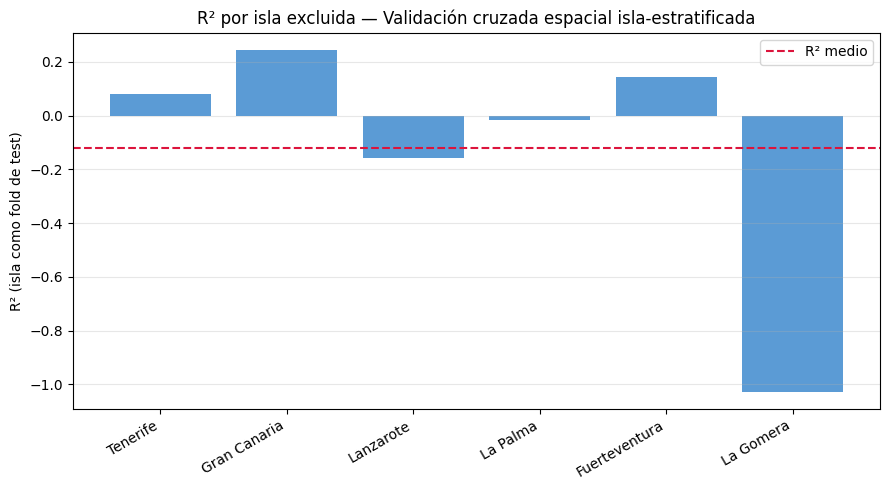

In [18]:
plt.figure(figsize=(9, 5))
plt.bar(spatial_kfold_df['isla_test'], spatial_kfold_df['r2'], color='#5B9BD5')
plt.axhline(spatial_kfold_df['r2'].mean(), color='crimson', linestyle='--', label='R² medio')
plt.title('R² por isla excluida — Validación cruzada espacial isla-estratificada')
plt.ylabel('R² (isla como fold de test)')
plt.xticks(rotation=30, ha='right')
plt.legend()
plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

### 6.3. Modelo final (variables RFE, entrenamiento en GPU)

Se entrena un modelo final con el subconjunto de variables seleccionado por RFE, usado para el análisis de importancia de variables. Las métricas de referencia del proyecto son las del Spatial Island K-Fold (sección 6.2); este split aleatorio adicional se reporta solo como contraste, para cuantificar cuánto se infla el rendimiento aparente cuando no se respeta la estructura espacial — la comparación que motiva el punto 3 de la validación.

In [19]:
# Reutiliza el MISMO split de §6.1 donde se ajustó RFE (sin re-partir: repartir de
# nuevo mezclaría train/test de selección y evaluación).
xgb_model = xgb.XGBRegressor(
    n_estimators=200, max_depth=4, learning_rate=0.05,
    random_state=RANDOM_STATE, n_jobs=-1,
    tree_method='hist', device=XGB_DEVICE,
)
xgb_model.fit(X_XGB_TRAIN, Y_XGB_TRAIN)

from sklearn.metrics import mean_squared_error, r2_score
y_pred = xgb_model.predict(X_XGB_TEST)
rmse_xgb = np.sqrt(mean_squared_error(Y_XGB_TEST, y_pred))
r2_xgb = r2_score(Y_XGB_TEST, y_pred)

print(f'XGBoost (split aleatorio, vars RFE train-only, GPU={XGB_DEVICE}) — RMSE: {rmse_xgb:.4f} | R²: {r2_xgb:.4f}')
print(f'Etiqueta objetivo: {RENTA_COL} (sin predictores de renta ni KPIs derivados)')
n_tot_sp = spatial_kfold_df['n_secciones_test'].sum()
r2_pond_sp = (spatial_kfold_df['r2'] * spatial_kfold_df['n_secciones_test']).sum() / n_tot_sp
print(f"\nComparación con Spatial Island K-Fold: R² macro = {spatial_kfold_df['r2'].mean():.4f} | ponderado = {r2_pond_sp:.4f}")
print('Si el R² del split aleatorio es notablemente mayor que el del Spatial Island K-Fold,')
print('eso confirma la inflación artificial por autocorrelación espacial que se buscaba evitar.')


XGBoost (split aleatorio, vars RFE train-only, GPU=cpu) — RMSE: 0.1755 | R²: 0.3748
Etiqueta objetivo: renta_neta_media_persona_log1p (sin predictores de renta ni KPIs derivados)

Comparación con Spatial Island K-Fold: R² macro = -0.1219 | ponderado = 0.1158
Si el R² del split aleatorio es notablemente mayor que el del Spatial Island K-Fold,
eso confirma la inflación artificial por autocorrelación espacial que se buscaba evitar.


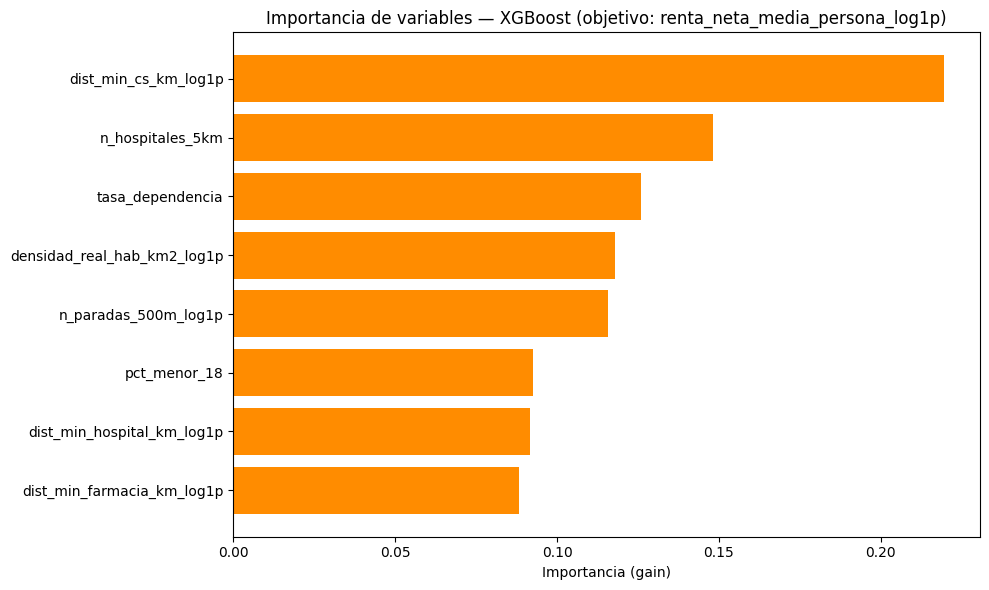

,variable,importancia
1,dist_min_cs_km_log1p,0.219709
3,n_hospitales_5km,0.148288
7,tasa_dependencia,0.125930
5,densidad_real_hab_km2_log1p,0.118055
4,n_paradas_500m_log1p,0.115909
6,pct_menor_18,0.092437
0,dist_min_hospital_km_log1p,0.091505
2,dist_min_farmacia_km_log1p,0.088167


In [20]:
# Importancia de variables — útil para comparar contra la interpretación territorial del AE
importancias = pd.DataFrame({
    'variable': X_xgb.columns,
    'importancia': xgb_model.feature_importances_,
}).sort_values('importancia', ascending=False)

plt.figure(figsize=(10, 6))
plt.barh(importancias['variable'], importancias['importancia'], color='darkorange')
plt.title(f'Importancia de variables — XGBoost (objetivo: {RENTA_COL})')
plt.xlabel('Importancia (gain)')
plt.gca().invert_yaxis()
plt.tight_layout()
plt.show()

display(importancias)

## 7. Validación comparativa entre estrategias

Se aplican las cuatro técnicas de validación definidas en la planificación del proyecto sobre las dos estrategias no supervisadas (Autoencoder y PCA), con K-Means como herramienta de evaluación post-hoc sobre ambas, y XGBoost como referencia de techo supervisado al margen de esta comparación.

### 7.1. Técnica 1 — Índice de Moran Global y Local (LISA)

=== Moran's I medio por estrategia (criterio principal de ranking) ===



,estrategia,moran_i_medio,dimensiones
0,Autoencoder,0.615393,3
1,PCA,0.593876,3



Diferencia absoluta AE vs. PCA: 0.0215


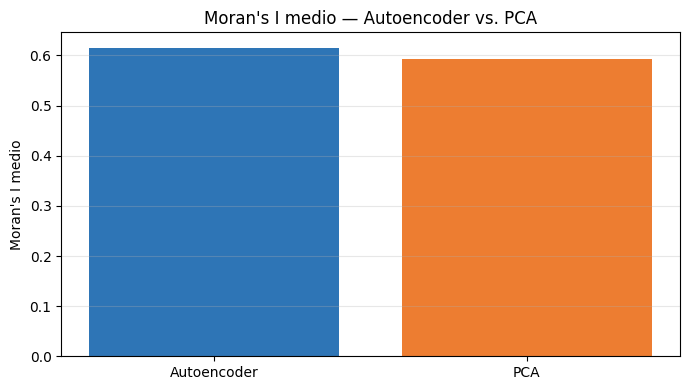

In [21]:
tabla_moran_comparativa = pd.DataFrame([
    {'estrategia': 'Autoencoder', 'moran_i_medio': moran_medio, 'dimensiones': LATENT_DIM_FINAL},
    {'estrategia': 'PCA',         'moran_i_medio': moran_medio_pca, 'dimensiones': LATENT_DIM_FINAL},
]).sort_values('moran_i_medio', ascending=False)

print('=== Moran\'s I medio por estrategia (criterio principal de ranking) ===\n')
display(tabla_moran_comparativa)

diferencia_moran = abs(moran_medio - moran_medio_pca)
print(f'\nDiferencia absoluta AE vs. PCA: {diferencia_moran:.4f}')

plt.figure(figsize=(7, 4))
plt.bar(tabla_moran_comparativa['estrategia'], tabla_moran_comparativa['moran_i_medio'],
        color=['#2E75B6', '#ED7D31'])
plt.title("Moran's I medio — Autoencoder vs. PCA")
plt.ylabel("Moran's I medio")
plt.grid(True, axis='y', alpha=0.3)
plt.tight_layout()
plt.show()

In [22]:
# Test de permutación PAREADO por unidad: H0 = AE y PCA son intercambiables.
# Para cada unidad se intercambian sus vectores AE/PCA con p=0.5 (preserva W y la
# estructura espacial; el test anterior que mezclaba filas entre métodos era inválido).
def test_permutacion_moran_pareado(rep_a, rep_b, w, n_iter=500, seed=RANDOM_STATE):
    assert rep_a.shape == rep_b.shape, 'AE y PCA deben tener igual dimensionalidad para el test pareado'
    rng = np.random.default_rng(seed)
    _, moran_a = moran_i_promedio(rep_a, w, n_permutations=99)
    _, moran_b = moran_i_promedio(rep_b, w, n_permutations=99)
    diff_observada = moran_a - moran_b
    diffs = []
    for _ in range(n_iter):
        swap = rng.random(rep_a.shape[0]) < 0.5
        pa = rep_a.copy(); pb = rep_b.copy()
        pa[swap], pb[swap] = rep_b[swap], rep_a[swap]
        _, ma = moran_i_promedio(pa, w, n_permutations=49)
        _, mb = moran_i_promedio(pb, w, n_permutations=49)
        diffs.append(ma - mb)
    diffs = np.array(diffs)
    p_valor = (np.abs(diffs) >= np.abs(diff_observada)).mean()
    return diff_observada, p_valor

print('Ejecutando test de permutación pareado (200 iteraciones)...')
diff_obs, p_valor_moran = test_permutacion_moran_pareado(latent_space_ae, pca_space, w_island_aware, n_iter=200)
print(f'\nDiferencia observada (AE - PCA): {diff_obs:.4f}')
print(f'p-valor (test pareado): {p_valor_moran:.4f}')
print('→ Si p > 0.05, la diferencia de Moran\'s I entre AE y PCA NO es estadísticamente significativa:')
print('  el argumento de valor del AE debe sostenerse en el análisis de sensibilidad (sección 7.4), no en este test global.')


Ejecutando test de permutación pareado (200 iteraciones)...

Diferencia observada (AE - PCA): 0.0215
p-valor (test pareado): 0.2950
→ Si p > 0.05, la diferencia de Moran's I entre AE y PCA NO es estadísticamente significativa:
  el argumento de valor del AE debe sostenerse en el análisis de sensibilidad (sección 7.4), no en este test global.


#### Moran's I Local (LISA)

El Moran's I global resume la autocorrelación espacial en un único valor por dimensión, pero no localiza *dónde* se concentra esa estructura. **LISA (Local Indicators of Spatial Association)** calcula un estadístico por cada sección censal, permitiendo identificar "bolsas" concretas de segregación o de acceso privilegiado: clústeres High-High (zonas de valor alto rodeadas de valor alto, privilegio territorial concentrado), Low-Low (privación concentrada), y los casos atípicos High-Low / Low-High (una sección que rompe con el patrón de su entorno inmediato). Se calcula sobre la primera dimensión del espacio latente del Autoencoder y sobre la primera dimensión continua de cada espacio (AE y PCA), para detectar tanto segregación en la representación continua como en la tipología territorial discreta resultante.

In [23]:
def calcular_lisa(valores, w, etiquetas_cusec, n_permutations=999):
    """Calcula LISA (Moran_Local) y clasifica cada unidad en uno de los cuatro cuadrantes."""
    lisa = Moran_Local(valores, w, permutations=n_permutations, seed=RANDOM_STATE)

    # Cuadrantes de PySAL: 1=High-High, 2=Low-High, 3=Low-Low, 4=High-Low
    etiquetas_cuadrante = {1: 'High-High', 2: 'Low-High', 3: 'Low-Low', 4: 'High-Low'}
    significativo = lisa.p_sim < 0.05

    resultado_df = pd.DataFrame({
        'CUSEC': etiquetas_cusec,
        'lisa_i': lisa.Is,
        'p_value': lisa.p_sim,
        'cuadrante': [etiquetas_cuadrante[q] for q in lisa.q],
        'significativo': significativo,
    })
    # Las unidades no significativas se reclasifican como 'No significativo' para no sobre-interpretar el mapa
    resultado_df.loc[~resultado_df['significativo'], 'cuadrante'] = 'No significativo'
    return resultado_df


# Alinear cusec al mismo orden que usa la matriz de pesos (id_order)
id_order = w_island_aware.id_order
cusec_to_pos = {c: i for i, c in enumerate(merged_df['CUSEC'].values)}
reorder_idx = [cusec_to_pos[cid] for cid in id_order]

# LISA sobre la primera dimensión del espacio latente del Autoencoder
lisa_ae_df = calcular_lisa(latent_space_ae[reorder_idx, 0], w_island_aware, id_order)
print('=== LISA sobre la dimensión 0 del espacio latente (Autoencoder) ===')
print(lisa_ae_df['cuadrante'].value_counts())

print('\n=== LISA sobre la dimensión 0 de PCA ===')
lisa_pca_df = calcular_lisa(pca_space[reorder_idx, 0], w_island_aware, id_order)
print(lisa_pca_df['cuadrante'].value_counts())

=== LISA sobre la dimensión 0 del espacio latente (Autoencoder) ===
cuadrante
No significativo    911
High-High           308
Low-Low             281
Low-High             41
High-Low             40
Name: count, dtype: int64

=== LISA sobre la dimensión 0 de PCA ===
cuadrante
No significativo    829
High-High           436
Low-Low             303
High-Low             11
Low-High              2
Name: count, dtype: int64


Autoencoder — secciones en clúster High-High (privilegio concentrado): 308
Autoencoder — secciones en clúster Low-Low (privación concentrada): 281


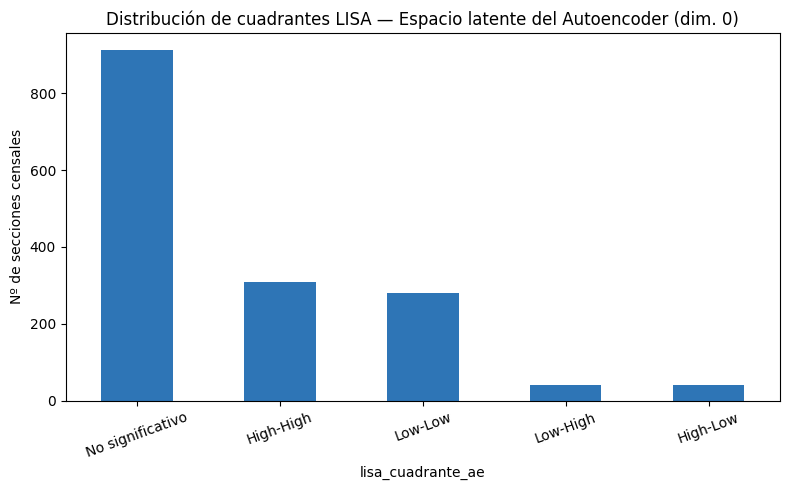

In [24]:
# Unir resultado LISA con merged_df para poder cartografiarlo en la sección 8
lisa_ae_df_renamed = lisa_ae_df.rename(columns={'cuadrante': 'lisa_cuadrante_ae'})[['CUSEC', 'lisa_cuadrante_ae']]
lisa_pca_df_renamed = lisa_pca_df.rename(columns={'cuadrante': 'lisa_cuadrante_pca'})[['CUSEC', 'lisa_cuadrante_pca']]

merged_df = merged_df.merge(lisa_ae_df_renamed, on='CUSEC', how='left')
merged_df = merged_df.merge(lisa_pca_df_renamed, on='CUSEC', how='left')

n_highhigh_ae = (merged_df['lisa_cuadrante_ae'] == 'High-High').sum()
n_lowlow_ae = (merged_df['lisa_cuadrante_ae'] == 'Low-Low').sum()
print(f'Autoencoder — secciones en clúster High-High (privilegio concentrado): {n_highhigh_ae}')
print(f'Autoencoder — secciones en clúster Low-Low (privación concentrada): {n_lowlow_ae}')

fig, ax = plt.subplots(figsize=(8, 5))
merged_df['lisa_cuadrante_ae'].value_counts().plot(kind='bar', color='#2E75B6', ax=ax)
ax.set_title('Distribución de cuadrantes LISA — Espacio latente del Autoencoder (dim. 0)')
ax.set_ylabel('Nº de secciones censales')
plt.xticks(rotation=20)
plt.tight_layout()
plt.show()

### 7.2. Técnica 2 — Silhouette Score y Davies-Bouldin Index

=== Silhouette Score y Davies-Bouldin Index (criterios secundarios de validación) ===



,estrategia,k,silhouette,davies_bouldin
0,K-Means sobre Autoencoder,4,0.579512,0.548641
1,K-Means sobre PCA,2,0.350220,1.081409


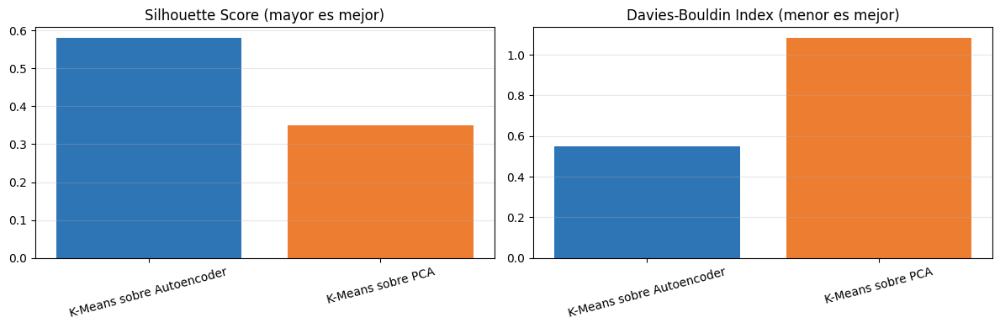

In [25]:
tabla_clustering_comparativa = pd.DataFrame([
    {'estrategia': 'K-Means sobre Autoencoder', 'k': K_OPTIMO_AE, 'silhouette': sil_ae_final, 'davies_bouldin': db_ae_final},
    {'estrategia': 'K-Means sobre PCA',         'k': K_OPTIMO_PCA, 'silhouette': sil_pca_final, 'davies_bouldin': db_pca_final},
])

print('=== Silhouette Score y Davies-Bouldin Index (criterios secundarios de validación) ===\n')
display(tabla_clustering_comparativa)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].bar(tabla_clustering_comparativa['estrategia'], tabla_clustering_comparativa['silhouette'], color=['#2E75B6', '#ED7D31'])
axes[0].set_title('Silhouette Score (mayor es mejor)')
axes[0].tick_params(axis='x', rotation=15)
axes[0].grid(True, axis='y', alpha=0.3)

axes[1].bar(tabla_clustering_comparativa['estrategia'], tabla_clustering_comparativa['davies_bouldin'], color=['#2E75B6', '#ED7D31'])
axes[1].set_title('Davies-Bouldin Index (menor es mejor)')
axes[1].tick_params(axis='x', rotation=15)
axes[1].grid(True, axis='y', alpha=0.3)

plt.tight_layout()
plt.show()

### 7.3. Técnica 3 — Estabilidad estructural mediante bootstrap

Se entrena cada estrategia 100 veces sobre submuestras del 80% de las secciones censales y se mide la correlación de Spearman entre las representaciones obtenidas en iteraciones sucesivas (tras alinear por los CUSEC comunes), como indicador de robustez estructural frente a perturbaciones de los datos.

In [26]:
N_BOOTSTRAP = 30  # igual N para PCA y AE (100 opcional; 30 por coste del AE)
FRAC_BOOTSTRAP = 0.8

def _corr_alineada(a, b):
    """Correlación media tras alinear dimensiones por máxima |Spearman| (greedy).
    Evita penalizar permutaciones de signo/orden del latente."""
    d = min(a.shape[1], b.shape[1])
    C = np.zeros((d, d))
    for i in range(d):
        for j in range(d):
            c, _ = spearmanr(a[:, i], b[:, j])
            C[i, j] = 0 if np.isnan(c) else abs(c)
    usadas_b, vals = set(), []
    for i in range(d):
        j_best = max([j for j in range(d) if j not in usadas_b], key=lambda j: C[i, j])
        usadas_b.add(j_best)
        vals.append(C[i, j_best])
    return float(np.mean(vals))


def bootstrap_estabilidad_pca(X, n_iter=N_BOOTSTRAP, frac=FRAC_BOOTSTRAP):
    n = X.shape[0]
    n_sample = int(n * frac)
    correlaciones = []
    rep_anterior = None
    idx_anterior = None

    for i in range(n_iter):
        idx = np.random.choice(n, n_sample, replace=False)
        pca_boot = PCA(n_components=LATENT_DIM_FINAL, random_state=RANDOM_STATE).fit_transform(X[idx])

        if rep_anterior is not None:
            comunes = np.intersect1d(idx, idx_anterior)
            if len(comunes) > 10:
                pos_actual = [np.where(idx == c)[0][0] for c in comunes]
                pos_anterior = [np.where(idx_anterior == c)[0][0] for c in comunes]
                correlaciones.append(_corr_alineada(rep_anterior[pos_anterior], pca_boot[pos_actual]))

        rep_anterior = pca_boot
        idx_anterior = idx

    return np.array(correlaciones)


def bootstrap_estabilidad_ae(X, n_iter=N_BOOTSTRAP, frac=FRAC_BOOTSTRAP, epochs=100):
    n = X.shape[0]
    n_sample = int(n * frac)
    correlaciones = []
    rep_anterior = None
    idx_anterior = None

    for i in range(n_iter):
        idx = np.random.choice(n, n_sample, replace=False)
        _, ae_boot, _ = entrenar_autoencoder(
            X[idx], latent_dim=MEJORES_HIPERPARAMETROS['latent_dim'],
            hidden_dim=MEJORES_HIPERPARAMETROS['hidden_dim'],
            activation=MEJORES_HIPERPARAMETROS['activation'],
            lr=MEJORES_HIPERPARAMETROS['lr'], epochs=epochs, seed=RANDOM_STATE + i,
        )

        if rep_anterior is not None:
            comunes = np.intersect1d(idx, idx_anterior)
            if len(comunes) > 10:
                pos_actual = [np.where(idx == c)[0][0] for c in comunes]
                pos_anterior = [np.where(idx_anterior == c)[0][0] for c in comunes]
                correlaciones.append(_corr_alineada(rep_anterior[pos_anterior], ae_boot[pos_actual]))

        rep_anterior = ae_boot
        idx_anterior = idx

    return np.array(correlaciones)

print(f'Funciones de bootstrap definidas ({N_BOOTSTRAP} iteraciones iguales para PCA y AE, {int(FRAC_BOOTSTRAP*100)}% de la muestra).')
print('Métrica alineada por dimensión (robusta a signo/permuntación del latente).')


Funciones de bootstrap definidas (30 iteraciones iguales para PCA y AE, 80% de la muestra).
Métrica alineada por dimensión (robusta a signo/permuntación del latente).


--- Ejecutando bootstrap de estabilidad: PCA ---
  Correlación media entre iteraciones sucesivas: 0.9824 (±0.0228)

--- Ejecutando bootstrap de estabilidad: Autoencoder ---
  (mismo N que PCA; considerar GPU en Colab)
  Correlación media entre iteraciones sucesivas: 0.4894 (±0.1315)


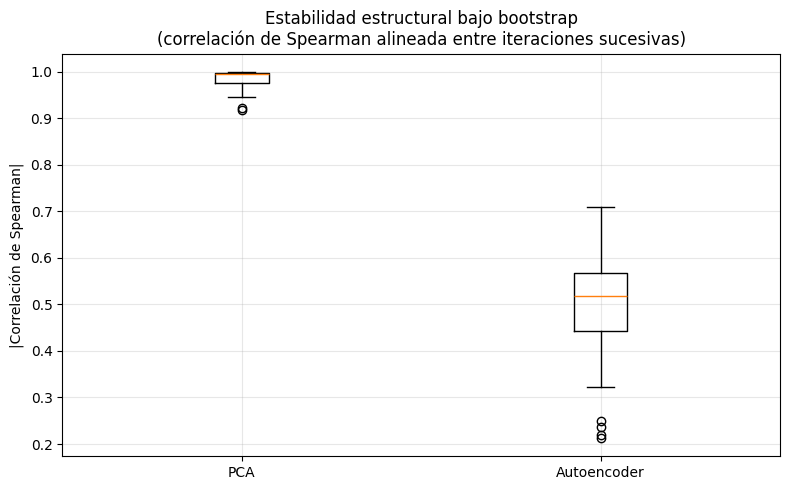


[RESUMEN] Estabilidad PCA: 0.9824 | Estabilidad AE: 0.4894
Una estrategia más estable bajo perturbaciones de los datos es preferible, en igualdad de Moran's I.


In [27]:
print('--- Ejecutando bootstrap de estabilidad: PCA ---')
correlaciones_pca = bootstrap_estabilidad_pca(X_scaled)
print(f'  Correlación media entre iteraciones sucesivas: {correlaciones_pca.mean():.4f} (±{correlaciones_pca.std():.4f})')

print('\n--- Ejecutando bootstrap de estabilidad: Autoencoder ---')
print('  (mismo N que PCA; considerar GPU en Colab)')
correlaciones_ae = bootstrap_estabilidad_ae(X_scaled, n_iter=N_BOOTSTRAP, epochs=100)
print(f'  Correlación media entre iteraciones sucesivas: {correlaciones_ae.mean():.4f} (±{correlaciones_ae.std():.4f})')

fig, ax = plt.subplots(figsize=(8, 5))
ax.boxplot([correlaciones_pca, correlaciones_ae], labels=['PCA', 'Autoencoder'])
ax.set_title('Estabilidad estructural bajo bootstrap\n(correlación de Spearman alineada entre iteraciones sucesivas)')
ax.set_ylabel('|Correlación de Spearman|')
ax.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

print(f'\n[RESUMEN] Estabilidad PCA: {correlaciones_pca.mean():.4f} | Estabilidad AE: {correlaciones_ae.mean():.4f}')
print('Una estrategia más estable bajo perturbaciones de los datos es preferible, en igualdad de Moran\'s I.')


### 7.4. Técnica 4 — Análisis de ablación (sensibilidad de variables)

Se retira sistemáticamente cada grupo temático de variables (salud, transporte, demografía, educación, KPIs derivados) del feature-set y se reentrena el Autoencoder sin esa dimensión, midiendo la variación resultante en el Moran's I medio. Este es un **análisis de ablación** en el sentido estricto del término: cuantifica la contribución marginal de cada grupo de variables a la estructura territorial aprendida por el modelo, en lugar de inferirla indirectamente a partir de pesos o coeficientes del modelo entrenado con todas las variables.

In [28]:
dimensiones_unicas = sorted(set(dimension_de_feature.values()))
print(f'Dimensiones a evaluar: {dimensiones_unicas}')

resultados_sensibilidad = []
resultados_sensibilidad.append({
    'dimension_retirada': 'Ninguna (modelo completo)',
    'n_variables_restantes': len(FEATURES_NO_ECONOMICAS),
    'moran_i_medio': moran_medio,
    'caida_absoluta': 0.0,
})

SEEDS_ABLACION = [42, 43, 44]
EPOCHS_ABLACION = 200

for dim in dimensiones_unicas:
    vars_a_retirar = [v for v, d in dimension_de_feature.items() if d == dim]
    vars_restantes = [v for v in FEATURES_NO_ECONOMICAS if v not in vars_a_retirar]

    if len(vars_restantes) < 2:
        print(f'  [{dim}] omitido: quedarían menos de 2 variables.')
        continue

    # Capacidad proporcional al nº de inputs (si no, quitar 7 vars como demografía
    # se confunde con reducir capacidad). Mínimo 4 neuronas.
    hidden_prop = max(4, round(MEJORES_HIPERPARAMETROS['hidden_dim'] * len(vars_restantes) / len(FEATURES_NO_ECONOMICAS)))
    print(f'--- Ablación "{dim}" ({len(vars_a_retirar)} vars retiradas, hidden {MEJORES_HIPERPARAMETROS["hidden_dim"]}→{hidden_prop}, {len(SEEDS_ABLACION)} seeds) ---')
    X_sin_dim = merged_df[vars_restantes].fillna(merged_df[vars_restantes].median())
    X_sin_dim_scaled = StandardScaler().fit_transform(X_sin_dim)

    morans_rep = []
    for s in SEEDS_ABLACION:
        _, latente_sin_dim, _ = entrenar_autoencoder(
            X_sin_dim_scaled, latent_dim=MEJORES_HIPERPARAMETROS['latent_dim'],
            hidden_dim=hidden_prop,
            activation=MEJORES_HIPERPARAMETROS['activation'],
            lr=MEJORES_HIPERPARAMETROS['lr'], epochs=EPOCHS_ABLACION, seed=s,
        )
        _, moran_sin_dim = moran_i_promedio(latente_sin_dim, w_island_aware, n_permutations=99)
        morans_rep.append(moran_sin_dim)
    moran_sin_dim = float(np.mean(morans_rep))
    moran_std = float(np.std(morans_rep))

    caida = moran_medio - moran_sin_dim
    # Caída normalizada por nº de variables retiradas (las dimensiones tienen 1-7 vars)
    caida_por_var = caida / max(1, len(vars_a_retirar))
    resultados_sensibilidad.append({
        'dimension_retirada': dim,
        'n_variables_restantes': len(vars_restantes),
        'moran_i_medio': moran_sin_dim,
        'caida_absoluta': caida,
    })
    print(f'  Moran sin "{dim}": {moran_sin_dim:.4f} (±{moran_std:.4f}) (caída: {caida:+.4f}, por var: {caida_por_var:+.4f})')

sensibilidad_df = pd.DataFrame(resultados_sensibilidad).sort_values('caida_absoluta', ascending=False)
print()
display(sensibilidad_df)
print('NOTA: demografía (7 vars) puede subir Moran al retirarla = aportaba ruido espacial; ver caída por variable.')


Dimensiones a evaluar: ['demografia', 'educacion', 'kpi_derivado', 'salud', 'transporte']
--- Ablación "demografia" (7 vars retiradas, hidden 32→20, 3 seeds) ---
  Moran sin "demografia": 0.7894 (±0.0070) (caída: -0.1740, por var: -0.0249)
--- Ablación "educacion" (1 vars retiradas, hidden 32→30, 3 seeds) ---
  Moran sin "educacion": 0.6246 (±0.0248) (caída: -0.0093, por var: -0.0093)
--- Ablación "kpi_derivado" (4 vars retiradas, hidden 32→25, 3 seeds) ---
  Moran sin "kpi_derivado": 0.6523 (±0.0284) (caída: -0.0369, por var: -0.0092)
--- Ablación "salud" (4 vars retiradas, hidden 32→25, 3 seeds) ---
  Moran sin "salud": 0.5825 (±0.0283) (caída: +0.0329, por var: +0.0082)
--- Ablación "transporte" (2 vars retiradas, hidden 32→28, 3 seeds) ---
  Moran sin "transporte": 0.6528 (±0.0321) (caída: -0.0374, por var: -0.0187)



,dimension_retirada,n_variables_restantes,moran_i_medio,caida_absoluta
4,salud,14,0.582455,0.032938
0,Ninguna (modelo completo),18,0.615393,0.000000
2,educacion,17,0.624644,-0.009250
3,kpi_derivado,14,0.652302,-0.036909
5,transporte,16,0.652773,-0.037380
1,demografia,11,0.789420,-0.174027


NOTA: demografía (7 vars) puede subir Moran al retirarla = aportaba ruido espacial; ver caída por variable.


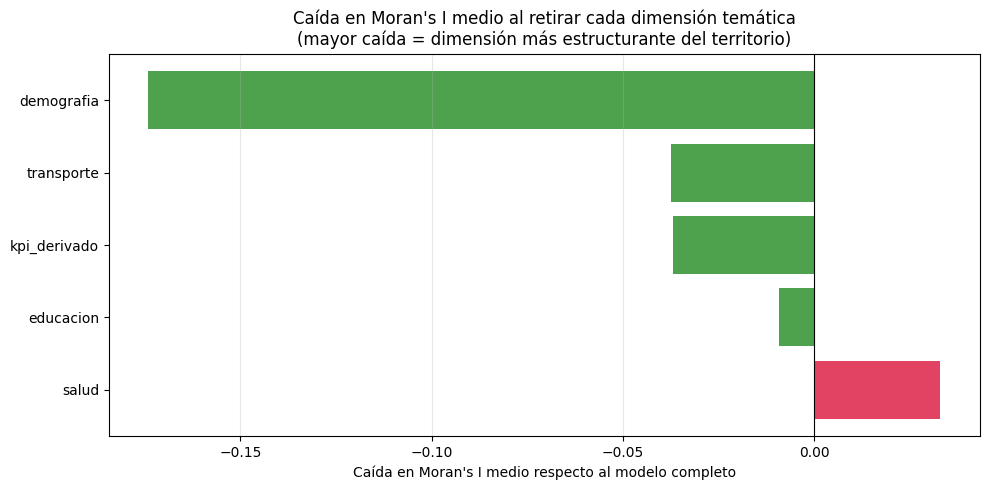


[RESULTADO] La dimensión cuya retirada produce mayor caída en coherencia espacial es: 'salud'
Esta es la dimensión que más estructura el territorio canario según el Autoencoder.


In [29]:
plt.figure(figsize=(10, 5))
datos_plot = sensibilidad_df[sensibilidad_df['dimension_retirada'] != 'Ninguna (modelo completo)']
colores = ['crimson' if c > 0 else 'forestgreen' for c in datos_plot['caida_absoluta']]
plt.barh(datos_plot['dimension_retirada'], datos_plot['caida_absoluta'], color=colores, alpha=0.8)
plt.axvline(0, color='black', linewidth=0.8)
plt.title('Caída en Moran\'s I medio al retirar cada dimensión temática\n(mayor caída = dimensión más estructurante del territorio)')
plt.xlabel("Caída en Moran's I medio respecto al modelo completo")
plt.grid(True, axis='x', alpha=0.3)
plt.tight_layout()
plt.show()

dimension_mas_estructurante = datos_plot.sort_values('caida_absoluta', ascending=False).iloc[0]['dimension_retirada']
print(f"\n[RESULTADO] La dimensión cuya retirada produce mayor caída en coherencia espacial es: '{dimension_mas_estructurante}'")
print('Esta es la dimensión que más estructura el territorio canario según el Autoencoder.')

## 8. Visualización territorial en mapas

Se cartografían los resultados de cada estrategia sobre el territorio real, en dos escalas: el archipiélago completo (visión de conjunto) y Lanzarote en detalle (ámbito de análisis territorial profundo del proyecto, dado el conocimiento local de la autora). Se generan mapas individuales por estrategia y un panel comparativo lado a lado.

In [30]:
merged_df['cluster_ae_str'] = merged_df['cluster_ae'].astype(str)
merged_df['cluster_pca_str'] = merged_df['cluster_pca'].astype(str)

PALETA_CLUSTER = ['#2E75B6', '#ED7D31', '#A5A5A5', '#FFC000', '#5B9BD5', '#70AD47', '#264478', '#9E480E']

def color_por_cluster(cluster_id, paleta=PALETA_CLUSTER):
    return paleta[int(cluster_id) % len(paleta)]

print('Colores de clúster preparados.')

Colores de clúster preparados.


### 8.1. Mapa del archipiélago completo — Autoencoder vs. PCA

In [31]:
def crear_mapa_clusters(df, cluster_col, titulo, center_lat=28.3, center_lon=-15.6, zoom=7):
    m = folium.Map(location=[center_lat, center_lon], zoom_start=zoom, tiles='OpenStreetMap')

    for _, row in df.iterrows():
        folium.CircleMarker(
            location=[row['centroid_lat'], row['centroid_lon']],
            radius=3,
            color=color_por_cluster(row[cluster_col]),
            fill=True,
            fill_color=color_por_cluster(row[cluster_col]),
            fill_opacity=0.7,
            popup=f"CUSEC: {row['CUSEC']}<br>Isla: {row['isla']}<br>Clúster: {row[cluster_col]}",
        ).add_to(m)

    title_html = f'<h4 style="text-align:center; font-family:Arial;">{titulo}</h4>'
    m.get_root().html.add_child(folium.Element(title_html))
    return m

mapa_ae_canarias = crear_mapa_clusters(
    merged_df, 'cluster_ae_str',
    f'Tipologías territoriales — Autoencoder (K={K_OPTIMO_AE}, latent_dim={LATENT_DIM_FINAL})',
)
mapa_ae_canarias

In [32]:
mapa_pca_canarias = crear_mapa_clusters(
    merged_df, 'cluster_pca_str',
    f'Tipologías territoriales — PCA (K={K_OPTIMO_PCA})',
)
mapa_pca_canarias

### 8.2. Mapa de detalle — Lanzarote

Lanzarote es el ámbito de análisis territorial detallado del proyecto. Se visualizan aquí los mismos clústeres con mayor zoom, permitiendo identificar qué municipios o zonas concretas corresponden a cada tipología.

In [33]:
lanzarote_df = merged_df[merged_df['isla'] == 'Lanzarote'].copy()
center_lat_lz = lanzarote_df['centroid_lat'].mean()
center_lon_lz = lanzarote_df['centroid_lon'].mean()

mapa_ae_lanzarote = crear_mapa_clusters(
    lanzarote_df, 'cluster_ae_str',
    f'Lanzarote — Tipologías territoriales (Autoencoder, K={K_OPTIMO_AE})',
    center_lat=center_lat_lz, center_lon=center_lon_lz, zoom=11,
)
display(mapa_ae_lanzarote)

In [34]:
if len(lanzarote_df) > 0:
    mapa_pca_lanzarote = crear_mapa_clusters(
        lanzarote_df, 'cluster_pca_str',
        f'Lanzarote — Tipologías territoriales (PCA, K={K_OPTIMO_PCA})',
        center_lat=center_lat_lz, center_lon=center_lon_lz, zoom=11,
    )
    display(mapa_pca_lanzarote)

### 8.2.bis. Mapa de coherencia geográfica — LISA (clústeres High-High / Low-Low)

Se cartografían los cuadrantes LISA calculados en la sección 7.1 sobre el espacio latente del Autoencoder, identificando visualmente dónde se concentran las "bolsas" de privilegio (High-High) o de privación (Low-Low) de acceso territorial, frente a las secciones sin agrupamiento espacial significativo.

In [35]:
COLOR_LISA = {
    'High-High': '#D73027',       # privilegio concentrado
    'Low-Low':   '#1A9850',       # privación concentrada (verde aquí por convención de "baja" intensidad de la variable, ajustar según signo de la dimensión)
    'High-Low':  '#FDAE61',
    'Low-High':  '#91BFDB',
    'No significativo': '#D9D9D9',
}

mapa_lisa = folium.Map(location=[28.3, -15.6], zoom_start=7, tiles='OpenStreetMap')
for _, row in merged_df.iterrows():
    cuadrante = row.get('lisa_cuadrante_ae', 'No significativo')
    folium.CircleMarker(
        location=[row['centroid_lat'], row['centroid_lon']],
        radius=3,
        color=COLOR_LISA.get(cuadrante, '#D9D9D9'),
        fill=True,
        fill_color=COLOR_LISA.get(cuadrante, '#D9D9D9'),
        fill_opacity=0.75,
        popup=f"CUSEC: {row['CUSEC']}<br>Isla: {row['isla']}<br>LISA: {cuadrante}",
    ).add_to(mapa_lisa)

leyenda_html = '''
<div style="position: fixed; bottom: 30px; left: 30px; z-index: 9999; background: white;
            padding: 10px; border: 1px solid #999; font-family: Arial; font-size: 12px;">
  <b>Cuadrante LISA</b><br>
  <span style="color:#D73027;">●</span> High-High (privilegio concentrado)<br>
  <span style="color:#1A9850;">●</span> Low-Low (privación concentrada)<br>
  <span style="color:#FDAE61;">●</span> High-Low (atípico)<br>
  <span style="color:#91BFDB;">●</span> Low-High (atípico)<br>
  <span style="color:#D9D9D9;">●</span> No significativo
</div>
'''
mapa_lisa.get_root().html.add_child(folium.Element(leyenda_html))
mapa_lisa.get_root().html.add_child(folium.Element(
    '<h4 style="text-align:center; font-family:Arial;">LISA — Coherencia geográfica del espacio latente (Autoencoder)</h4>'
))
mapa_lisa

### 8.3. Mapa de renta (variable proxy de XGBoost) — referencia de contraste

Se cartografía también la variable de renta usada como etiqueta proxy en XGBoost, en gradiente continuo, para poder contrastar visualmente si los clústeres no supervisados (AE, PCA) se alinean con la estructura de renta del territorio o capturan una estructura distinta.

In [36]:
import branca.colormap as cmp

merged_df[RENTA_COL] = merged_df[RENTA_COL].fillna(merged_df[RENTA_COL].median())
renta_min, renta_max = merged_df[RENTA_COL].min(), merged_df[RENTA_COL].max()
colormap_renta = cmp.LinearColormap(['#D73027', '#FEE08B', '#1A9850'], vmin=renta_min, vmax=renta_max)

mapa_renta = folium.Map(location=[28.3, -15.6], zoom_start=7, tiles='OpenStreetMap')
for _, row in merged_df.iterrows():
    folium.CircleMarker(
        location=[row['centroid_lat'], row['centroid_lon']],
        radius=3,
        color=colormap_renta(row[RENTA_COL]),
        fill=True,
        fill_color=colormap_renta(row[RENTA_COL]),
        fill_opacity=0.7,
        popup=f"CUSEC: {row['CUSEC']}<br>{RENTA_COL}: {row[RENTA_COL]:.2f}",
    ).add_to(mapa_renta)

colormap_renta.caption = f'{RENTA_COL} (etiqueta proxy de XGBoost)'
mapa_renta.add_child(colormap_renta)
mapa_renta.get_root().html.add_child(folium.Element(
    '<h4 style="text-align:center; font-family:Arial;">Distribución de renta — referencia de contraste</h4>'
))
mapa_renta

### 8.4. Panel comparativo estático (para incluir como figura en el documento)

Los mapas Folium son interactivos pero no se exportan bien a un documento Word/PDF. Esta figura estática con Matplotlib + GeoPandas-style scatter ofrece el mismo contraste visual AE vs. PCA en un único panel, apto para insertar directamente como figura del capítulo de resultados.

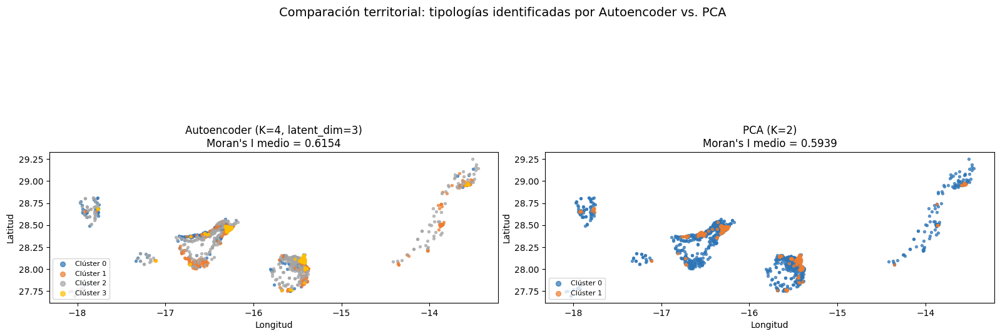

Figura guardada: panel_comparativo_ae_pca.png (lista para insertar en el documento del TFM)


In [37]:
fig, axes = plt.subplots(1, 2, figsize=(16, 7))

for cluster_id in sorted(merged_df['cluster_ae'].unique()):
    subset = merged_df[merged_df['cluster_ae'] == cluster_id]
    axes[0].scatter(subset['centroid_lon'], subset['centroid_lat'],
                     s=8, alpha=0.7, label=f'Clúster {cluster_id}',
                     color=PALETA_CLUSTER[cluster_id % len(PALETA_CLUSTER)])
axes[0].set_title(f'Autoencoder (K={K_OPTIMO_AE}, latent_dim={LATENT_DIM_FINAL})\nMoran\'s I medio = {moran_medio:.4f}', fontsize=12)
axes[0].set_xlabel('Longitud'); axes[0].set_ylabel('Latitud')
axes[0].legend(fontsize=8, markerscale=2, loc='lower left')
axes[0].set_aspect('equal')

for cluster_id in sorted(merged_df['cluster_pca'].unique()):
    subset = merged_df[merged_df['cluster_pca'] == cluster_id]
    axes[1].scatter(subset['centroid_lon'], subset['centroid_lat'],
                     s=8, alpha=0.7, label=f'Clúster {cluster_id}',
                     color=PALETA_CLUSTER[cluster_id % len(PALETA_CLUSTER)])
axes[1].set_title(f'PCA (K={K_OPTIMO_PCA})\nMoran\'s I medio = {moran_medio_pca:.4f}', fontsize=12)
axes[1].set_xlabel('Longitud'); axes[1].set_ylabel('Latitud')
axes[1].legend(fontsize=8, markerscale=2, loc='lower left')
axes[1].set_aspect('equal')

plt.suptitle('Comparación territorial: tipologías identificadas por Autoencoder vs. PCA', fontsize=14)
plt.tight_layout()
plt.savefig('../data/outputs/panel_comparativo_ae_pca.png', dpi=200, bbox_inches='tight')
plt.show()
print('Figura guardada: panel_comparativo_ae_pca.png (lista para insertar en el documento del TFM)')

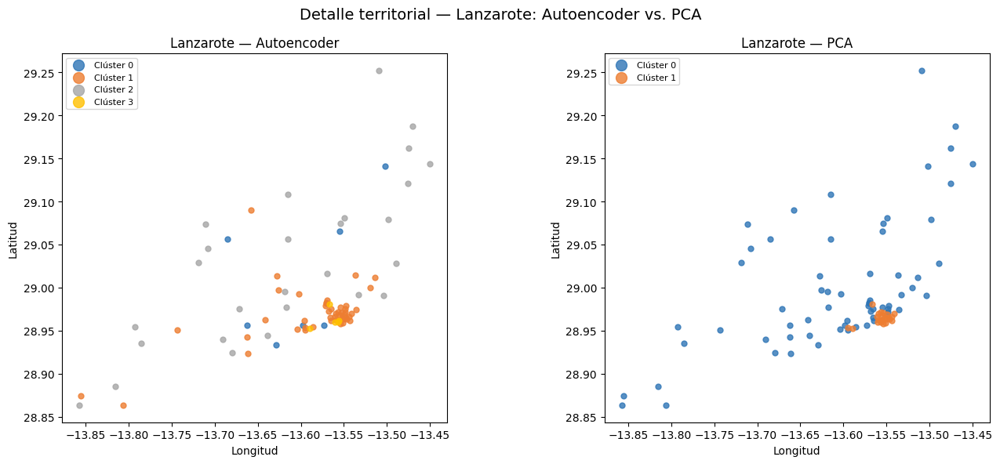

Figura guardada: panel_comparativo_lanzarote.png


In [38]:
# Panel de detalle: solo Lanzarote, lado a lado
if len(lanzarote_df) > 0:
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    for cluster_id in sorted(lanzarote_df['cluster_ae'].unique()):
        subset = lanzarote_df[lanzarote_df['cluster_ae'] == cluster_id]
        axes[0].scatter(subset['centroid_lon'], subset['centroid_lat'],
                         s=25, alpha=0.8, label=f'Clúster {cluster_id}',
                         color=PALETA_CLUSTER[cluster_id % len(PALETA_CLUSTER)])
    axes[0].set_title('Lanzarote — Autoencoder', fontsize=12)
    axes[0].set_xlabel('Longitud'); axes[0].set_ylabel('Latitud')
    axes[0].legend(fontsize=8, markerscale=2)
    axes[0].set_aspect('equal')

    for cluster_id in sorted(lanzarote_df['cluster_pca'].unique()):
        subset = lanzarote_df[lanzarote_df['cluster_pca'] == cluster_id]
        axes[1].scatter(subset['centroid_lon'], subset['centroid_lat'],
                         s=25, alpha=0.8, label=f'Clúster {cluster_id}',
                         color=PALETA_CLUSTER[cluster_id % len(PALETA_CLUSTER)])
    axes[1].set_title('Lanzarote — PCA', fontsize=12)
    axes[1].set_xlabel('Longitud'); axes[1].set_ylabel('Latitud')
    axes[1].legend(fontsize=8, markerscale=2)
    axes[1].set_aspect('equal')

    plt.suptitle('Detalle territorial — Lanzarote: Autoencoder vs. PCA', fontsize=14)
    plt.tight_layout()
    plt.savefig('../data/outputs/panel_comparativo_lanzarote.png', dpi=200, bbox_inches='tight')
    plt.show()
    print('Figura guardada: panel_comparativo_lanzarote.png')

### 8.5. Gráficos de radar — perfiles de acceso interpretables

Los gráficos de radar muestran simultáneamente las dimensiones temáticas (salud, transporte, demografía, educación) sobre los mismos ejes para cada clúster, permitiendo nombrar e interpretar los perfiles territoriales resultantes del Autoencoder de forma directamente comunicable a audiencias no técnicas de política pública, por ejemplo, distinguiendo un perfil "Rural Aislado" (baja accesibilidad, alta dependencia) de un perfil "Urbano Conectado" (alta accesibilidad, baja dependencia, alta densidad).

In [39]:
def calcular_perfil_promedio_por_cluster(df, cluster_col, variables):
    """Media por clúster normalizada con min/max GLOBALES (todo el dataset).
    La versión anterior normalizaba con min/max entre medias de clústeres, lo que
    con K=2 degenera a 1.0 vs 0.0 en todas las vars y vacía el radar."""
    perfil = df.groupby(cluster_col)[variables].mean()
    gmin = df[variables].min()
    gmax = df[variables].max()
    rango = (gmax - gmin).replace(0, np.nan)
    perfil_norm = (perfil - gmin) / rango
    return perfil_norm.fillna(0.5)


def graficar_radar(perfil_norm, titulo, paleta=None):
    categorias = list(perfil_norm.columns)
    n_cat = len(categorias)
    angulos = np.linspace(0, 2 * np.pi, n_cat, endpoint=False).tolist()
    angulos += angulos[:1]

    fig, ax = plt.subplots(figsize=(8, 8), subplot_kw=dict(polar=True))
    if paleta is None:
        paleta = PALETA_CLUSTER

    for i, (cluster_id, valores) in enumerate(perfil_norm.iterrows()):
        valores_plot = valores.tolist()
        valores_plot += valores_plot[:1]

        if np.all(valores == 0):
            ax.plot(angulos[0], 0, 'o', markersize=8, label=f'Clúster {cluster_id}', color=paleta[i % len(paleta)])
        else:
            ax.plot(angulos, valores_plot, linewidth=2, label=f'Clúster {cluster_id}', color=paleta[i % len(paleta)])
            ax.fill(angulos, valores_plot, alpha=0.1, color=paleta[i % len(paleta)])

    ax.set_xticks(angulos[:-1])
    ax.set_xticklabels(categorias, fontsize=9)
    ax.set_yticklabels([])
    ax.set_title(titulo, fontsize=13, pad=20)
    ax.legend(loc='upper right', bbox_to_anchor=(1.3, 1.1), fontsize=9)
    plt.tight_layout()
    plt.show()


# Variables representativas (una por dimensión temática) para que el radar sea legible
VARIABLES_RADAR = []
for dim in ['salud', 'transporte', 'demografia', 'educacion']:
    vars_dim = [v for v, d in dimension_de_feature.items() if d == dim]
    if vars_dim:
        VARIABLES_RADAR.append(vars_dim[0])

print(f'Variables usadas en el radar (una por dimensión): {VARIABLES_RADAR}')


Variables usadas en el radar (una por dimensión): ['dist_min_hospital_km_log1p', 'dist_min_parada_km_log1p', 'poblacion_total_log1p', 'dist_min_colegio_km_log1p']


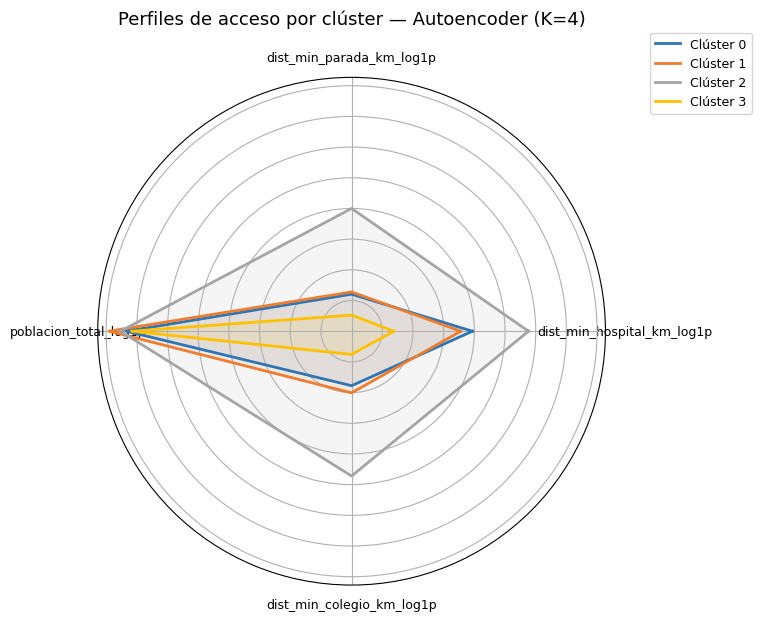

Interpretación: valores más altos en distmin* (distancias) indican PEOR accesibilidad,
por lo que un perfil "Urbano Conectado" debería mostrar valores bajos en las dimensiones de distancia
y altos en densidad/población; un perfil "Rural Aislado" muestra el patrón inverso.


,dist_min_hospital_km_log1p,dist_min_parada_km_log1p,poblacion_total_log1p,dist_min_colegio_km_log1p
cluster_ae,,,,
0,0.393764,0.120648,0.734364,0.177611
1,0.355775,0.127966,0.790333,0.200925
2,0.576510,0.400128,0.753341,0.472002
3,0.137858,0.052538,0.717450,0.075620


In [40]:
perfil_ae = calcular_perfil_promedio_por_cluster(merged_df, 'cluster_ae', VARIABLES_RADAR)
graficar_radar(perfil_ae, f'Perfiles de acceso por clúster — Autoencoder (K={K_OPTIMO_AE})')

print('Interpretación: valores más altos en distmin* (distancias) indican PEOR accesibilidad,')
print('por lo que un perfil "Urbano Conectado" debería mostrar valores bajos en las dimensiones de distancia')
print('y altos en densidad/población; un perfil "Rural Aislado" muestra el patrón inverso.')
display(perfil_ae)

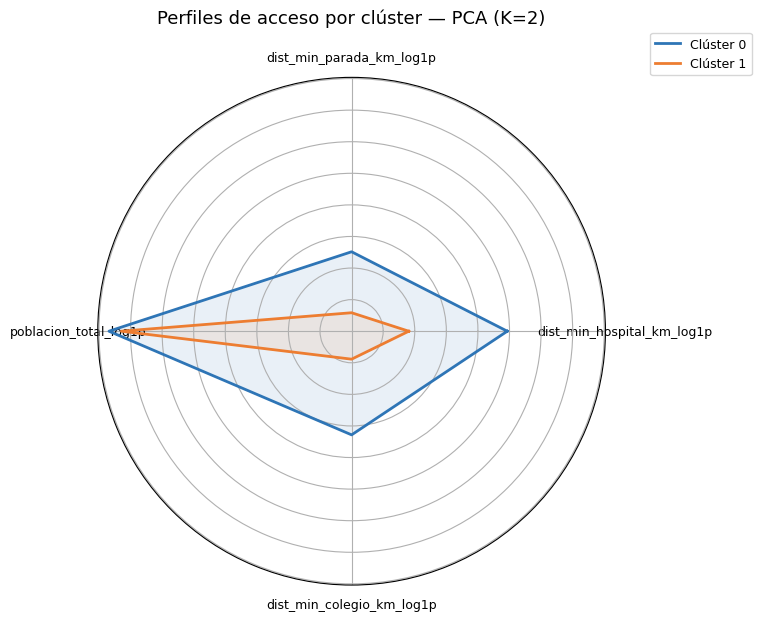

,dist_min_hospital_km_log1p,dist_min_parada_km_log1p,poblacion_total_log1p,dist_min_colegio_km_log1p
cluster_pca,,,,
0,0.492901,0.251542,0.768281,0.328194
1,0.180984,0.058482,0.729048,0.088577


In [41]:
perfil_pca = calcular_perfil_promedio_por_cluster(merged_df, 'cluster_pca', VARIABLES_RADAR)
graficar_radar(perfil_pca, f'Perfiles de acceso por clúster — PCA (K={K_OPTIMO_PCA})')
display(perfil_pca)

## 9. Tabla comparativa final de las cuatro tecnologías

Se consolidan en una única tabla todos los resultados obtenidos, recordando que **la comparación directa solo es metodológicamente válida entre Autoencoder y PCA** (mismo feature-set, ambos no supervisados). K-Means es una herramienta de evaluación aplicada sobre ambos espacios, no una estrategia de representación independiente con su propio Moran's I. XGBoost se reporta aparte, con sus propias métricas (RMSE, R²), porque resuelve una tarea distinta (regresión supervisada) y no es comparable en la misma escala.

In [42]:
print('=' * 80)
print('TABLA COMPARATIVA — AUTOENCODER vs. PCA (no supervisados, comparación principal)')
print('=' * 80)

tabla_final_no_supervisado = pd.DataFrame([
    {
        'Estrategia': 'Autoencoder',
        'Dimensiones': LATENT_DIM_FINAL,
        "Moran's I medio": round(moran_medio, 4),
        'K (K-Means)': K_OPTIMO_AE,
        'Silhouette': round(sil_ae_final, 4),
        'Davies-Bouldin': round(db_ae_final, 4),
        'Estabilidad bootstrap': round(correlaciones_ae.mean(), 4),
    },
    {
        'Estrategia': 'PCA',
        'Dimensiones': LATENT_DIM_FINAL,
        "Moran's I medio": round(moran_medio_pca, 4),
        'K (K-Means)': K_OPTIMO_PCA,
        'Silhouette': round(sil_pca_final, 4),
        'Davies-Bouldin': round(db_pca_final, 4),
        'Estabilidad bootstrap': round(correlaciones_pca.mean(), 4),
    },
])
display(tabla_final_no_supervisado)

print(f"\np-valor del test de permutación (Moran's I AE vs. PCA): {p_valor_moran:.4f}")
print('(p > 0.05 → la diferencia de Moran\'s I global no es estadísticamente significativa;')
print(' el análisis de sensibilidad de variables, sección 7.4, es el argumento que sostiene')
print(' el valor añadido del Autoencoder si el test global no es concluyente.)')

TABLA COMPARATIVA — AUTOENCODER vs. PCA (no supervisados, comparación principal)


,Estrategia,Dimensiones,Moran's I medio,K (K-Means),Silhouette,Davies-Bouldin,Estabilidad bootstrap
0,Autoencoder,3,0.6154,4,0.5795,0.5486,0.4894
1,PCA,3,0.5939,2,0.3502,1.0814,0.9824



p-valor del test de permutación (Moran's I AE vs. PCA): 0.2950
(p > 0.05 → la diferencia de Moran's I global no es estadísticamente significativa;
 el análisis de sensibilidad de variables, sección 7.4, es el argumento que sostiene
 el valor añadido del Autoencoder si el test global no es concluyente.)


In [43]:
print('=' * 80)
print('XGBOOST — BASELINE SUPERVISADO (referencia de techo, no comparable directamente)')
print('=' * 80)

n_tot_rep = int(spatial_kfold_df['n_secciones_test'].sum())
r2_macro = float(spatial_kfold_df['r2'].mean())
r2_pond_rep = float((spatial_kfold_df['r2'] * spatial_kfold_df['n_secciones_test']).sum() / n_tot_rep)

tabla_xgb = pd.DataFrame([{
    'Estrategia': 'XGBoost (etiqueta proxy: renta, sin leakage)',
    'Tarea': 'Regresión supervisada',
    'RMSE_split_aleatorio': round(rmse_xgb, 4),
    'R2_split_aleatorio': round(r2_xgb, 4),
    'R2_espacial_macro': round(r2_macro, 4),
    'R2_espacial_ponderado': round(r2_pond_rep, 4),
    'Variable más importante': importancias.iloc[0]['variable'],
}])
display(tabla_xgb)

print('\nInterpretación: el split aleatorio es optimista (autocorrelación espacial);')
print('la referencia válida del proyecto es el Spatial Island K-Fold (macro + ponderado).')
print('Tras excluir los KPIs derivados de renta, el R² debe leerse como señal territorial real,')
print('no como reconstrucción de la propia renta.')


XGBOOST — BASELINE SUPERVISADO (referencia de techo, no comparable directamente)


,Estrategia,Tarea,RMSE_split_aleatorio,R2_split_aleatorio,R2_espacial_macro,R2_espacial_ponderado,Variable más importante
0,"XGBoost (etiqueta proxy: renta, sin leakage)",Regresión supervisada,0.1755,0.3748,-0.1219,0.1158,dist_min_cs_km_log1p



Interpretación: el split aleatorio es optimista (autocorrelación espacial);
la referencia válida del proyecto es el Spatial Island K-Fold (macro + ponderado).
Tras excluir los KPIs derivados de renta, el R² debe leerse como señal territorial real,
no como reconstrucción de la propia renta.


In [44]:
# Resumen ejecutivo final, con los datos numéricos reales de esta ejecución
print('=' * 80)
print('RESUMEN EJECUTIVO DEL BENCHMARK')
print('=' * 80)

ganador_moran = 'Autoencoder' if moran_medio > moran_medio_pca else 'PCA'
ganador_silhouette = 'Autoencoder' if sil_ae_final > sil_pca_final else 'PCA'
ganador_estabilidad = 'Autoencoder' if correlaciones_ae.mean() > correlaciones_pca.mean() else 'PCA'

print(f"""
1. Coherencia espacial (Moran's I medio, criterio principal):
   {ganador_moran} obtiene mayor autocorrelación espacial ({max(moran_medio, moran_medio_pca):.4f} vs. {min(moran_medio, moran_medio_pca):.4f}).
   Significancia estadística de la diferencia: p={p_valor_moran:.4f} {'(significativa)' if p_valor_moran < 0.05 else '(NO significativa)'}.

2. Calidad de clustering (Silhouette / Davies-Bouldin):
   {ganador_silhouette} obtiene mejor separación de clústeres.

3. Estabilidad estructural (bootstrap):
   {ganador_estabilidad} es más estable bajo perturbaciones del 20% de las secciones censales.

4. Sensibilidad de variables:
   La dimensión '{dimension_mas_estructurante}' es la que más estructura el territorio canario
   según el Autoencoder (mayor caída de Moran's I al retirarla).

5. Referencia supervisada (XGBoost):
   RMSE={rmse_xgb:.4f}, R²={r2_xgb:.4f} sobre {RENTA_COL}, sin usar ninguna variable de renta como predictor.
""")

print('NOTA METODOLÓGICA FINAL:')
print('Si el test de permutación no es significativo, la conclusión correcta no es que el AE "pierda"')
print('frente a PCA, sino que con este volumen de datos y esta dimensionalidad ambos métodos capturan')
print('una coherencia espacial estadísticamente equivalente — un resultado válido y publicable en sí mismo,')
print('que debe documentarse como tal en el capítulo de discusión, sin forzar una narrativa de superioridad.')

RESUMEN EJECUTIVO DEL BENCHMARK

1. Coherencia espacial (Moran's I medio, criterio principal):
   Autoencoder obtiene mayor autocorrelación espacial (0.6154 vs. 0.5939).
   Significancia estadística de la diferencia: p=0.2950 (NO significativa).

2. Calidad de clustering (Silhouette / Davies-Bouldin):
   Autoencoder obtiene mejor separación de clústeres.

3. Estabilidad estructural (bootstrap):
   PCA es más estable bajo perturbaciones del 20% de las secciones censales.

4. Sensibilidad de variables:
   La dimensión 'salud' es la que más estructura el territorio canario
   según el Autoencoder (mayor caída de Moran's I al retirarla).

5. Referencia supervisada (XGBoost):
   RMSE=0.1755, R²=0.3748 sobre renta_neta_media_persona_log1p, sin usar ninguna variable de renta como predictor.

NOTA METODOLÓGICA FINAL:
Si el test de permutación no es significativo, la conclusión correcta no es que el AE "pierda"
frente a PCA, sino que con este volumen de datos y esta dimensionalidad ambos método

## 10. Exportación de resultados

Se guardan los resultados clave (espacio latente, clústeres, métricas) para su uso en el capítulo de resultados y en la generación de figuras y mapas finales del documento del TFE.

In [45]:
import os
RUTA_SALIDA = '../data/outputs/'
os.makedirs(RUTA_SALIDA, exist_ok=True)

merged_df.to_csv(RUTA_SALIDA + 'resultados_modelado.csv', index=False)
latent_space_df.to_csv(RUTA_SALIDA + 'latent_space_autoencoder.csv', index=False)
pca_df.to_csv(RUTA_SALIDA + 'pca_components.csv', index=False)
tabla_final_no_supervisado.to_csv(RUTA_SALIDA + 'tabla_comparativa_final.csv', index=False)
sensibilidad_df.to_csv(RUTA_SALIDA + 'analisis_ablacion.csv', index=False)
resultados_busqueda_df.to_csv(RUTA_SALIDA + 'busqueda_hiperparametros_ae.csv', index=False)
ranking_rfe.to_csv(RUTA_SALIDA + 'rfe_ranking_variables.csv', index=False)
spatial_kfold_df.to_csv(RUTA_SALIDA + 'xgboost_spatial_island_kfold.csv', index=False)
# Métricas ponderadas para el documento
pd.DataFrame([{'rmse_macro': spatial_kfold_df['rmse'].mean(),
               'r2_macro': spatial_kfold_df['r2'].mean()}]).to_csv(RUTA_SALIDA + 'xgb_spatial_resumen.csv', index=False)

import json as _json
with open(RUTA_SALIDA + 'mejores_hiperparametros_ae.json', 'w') as f:
    _json.dump(MEJORES_HIPERPARAMETROS, f, indent=2)

# Figuras: copiar a outputs si existen en CWD (los paneles se guardan ya en outputs)
import shutil, glob
for png in ['panel_comparativo_ae_pca.png', 'panel_comparativo_lanzarote.png']:
    for cand in [png, '../data/outputs/' + png]:
        pass
    if os.path.exists(png) and os.path.abspath(png) != os.path.abspath(RUTA_SALIDA + png):
        try:
            shutil.copy(png, RUTA_SALIDA + png)
        except Exception as e:
            print(f'Aviso copiando {png}: {e}')
# Export extendido con FCM si ya se ejecutó §7.6 (el orden del notebook ejecuta export antes;
# re-ejecutar esta celda al final incluye cluster_fcm/zona_transicion).
if 'cluster_fcm' in merged_df.columns:
    merged_df.to_csv(RUTA_SALIDA + 'resultados_modelado_con_fcm.csv', index=False)
    print('Incluido resultados_modelado_con_fcm.csv (con FCM/transición). Re-ejecutar esta celda tras §7.6.')

print('Resultados exportados a ../data/outputs/:')
print('  - resultados_modelado.csv (merged_df con clústeres AE/PCA y cuadrantes LISA)')
print('  - latent_space_autoencoder.csv')
print('  - pca_components.csv')
print('  - tabla_comparativa_final.csv')
print('  - analisis_ablacion.csv')
print('  - busqueda_hiperparametros_ae.csv (todas las combinaciones probadas en Random Search)')
print('  - mejores_hiperparametros_ae.json')
print('  - rfe_ranking_variables.csv')
print('  - xgboost_spatial_island_kfold.csv')
print('  - panel_comparativo_ae_pca.png / panel_comparativo_lanzarote.png (figuras para el documento)')


Resultados exportados a ../data/outputs/:
  - resultados_modelado.csv (merged_df con clústeres AE/PCA y cuadrantes LISA)
  - latent_space_autoencoder.csv
  - pca_components.csv
  - tabla_comparativa_final.csv
  - analisis_ablacion.csv
  - busqueda_hiperparametros_ae.csv (todas las combinaciones probadas en Random Search)
  - mejores_hiperparametros_ae.json
  - rfe_ranking_variables.csv
  - xgboost_spatial_island_kfold.csv
  - panel_comparativo_ae_pca.png / panel_comparativo_lanzarote.png (figuras para el documento)


## 10.1. Análisis formal del compromiso Sesgo-Varianza (Bias-Variance Trade-off)

El compromiso sesgo-varianza es fundamental en cualquier tarea de modelado, y en los modelos de reducción de dimensionalidad como el Autoencoder y PCA, se manifiesta de manera particular. Comprender este equilibrio nos permite evaluar la capacidad de un modelo para capturar la estructura subyacente de los datos (bajo sesgo) frente a su sensibilidad a las fluctuaciones en los datos de entrenamiento (baja varianza).

En este contexto:

*   **Sesgo (Bias):** Se refiere a la capacidad del modelo para capturar la verdadera estructura espacial y las relaciones intrínsecas de los datos. Un modelo con bajo sesgo es aquel que preserva mejor la coherencia territorial. Lo mediremos principalmente a través del **Moran's I medio** (mayor Moran's I = menor sesgo), y secundariamente, por el **error de reconstrucción (Autoencoder)** o la **varianza explicada (PCA)**.

*   **Varianza:** Se refiere a la sensibilidad del modelo a pequeñas perturbaciones en el dataset de entrenamiento. Un modelo con baja varianza es más estable y robusto, generalizando mejor a nuevos datos o submuestras. Lo mediremos a través de la **estabilidad estructural mediante bootstrap** (mayor correlación de Spearman = menor varianza).

Idealmente, buscamos un equilibrio entre ambos: una representación que capture bien la señal espacial y sea robusta ante cambios en la muestra. Un Autoencoder, al ser un modelo no lineal, tiene el potencial de capturar relaciones más complejas (menor sesgo), pero a menudo a costa de una mayor varianza. PCA, al ser lineal, suele tener mayor sesgo pero menor varianza.

In [46]:
# Métricas para el análisis de sesgo-varianza

# Sesgo (Bias) - Coherencia espacial y capacidad de retención de información
moran_ae = moran_medio
moran_pca = moran_medio_pca
mse_ae = losses_final[-1] # MSE de reconstrucción final del AE
var_explicada_pca = varianza_explicada.sum() # Varianza acumulada explicada por PCA

# Varianza - Estabilidad estructural
estabilidad_ae = correlaciones_ae.mean()
estabilidad_pca = correlaciones_pca.mean()

print(f"Análisis de Sesgo-Varianza (Bias-Variance Trade-off):\n")
print(f"--- Métricas de Sesgo (menor sesgo = mejor captura de estructura) ---")
print(f"  Moran's I medio (Autoencoder): {moran_ae:.4f} (Mayor es mejor)")
print(f"  Moran's I medio (PCA):         {moran_pca:.4f} (Mayor es mejor)")
print(f"  MSE de Reconstrucción (Autoencoder): {mse_ae:.4f} (Menor es mejor)")
print(f"  Varianza Explicada Acumulada (PCA):  {var_explicada_pca:.4f} (Mayor es mejor)")

print(f"\n--- Métricas de Varianza (menor varianza = mayor estabilidad) ---")
print(f"  Estabilidad Bootstrap (Autoencoder): {estabilidad_ae:.4f} (Mayor es mejor)")
print(f"  Estabilidad Bootstrap (PCA):         {estabilidad_pca:.4f} (Mayor es mejor)")

print(f"\nConclusión Provisional:")
if moran_ae > moran_pca:
    print(f"  - El Autoencoder muestra un sesgo ligeramente menor en términos de coherencia espacial (Moran's I medio). p-valor del test de permutación: {p_valor_moran:.4f}")
else:
    print(f"  - PCA muestra un sesgo ligeramente menor en términos de coherencia espacial (Moran's I medio). p-valor del test de permutación: {p_valor_moran:.4f}")

if estabilidad_pca > estabilidad_ae:
    print(f"  - PCA muestra una varianza significativamente menor, siendo mucho más estable ante perturbaciones de la muestra.")
else:
    print(f"  - El Autoencoder muestra una varianza menor, siendo más estable ante perturbaciones de la muestra.")

print(f"\nEstos resultados confirman la expectativa: el Autoencoder (no lineal) busca reducir el sesgo capturando estructuras más complejas, mientras que PCA (lineal) ofrece mayor estabilidad y menor varianza.")

Análisis de Sesgo-Varianza (Bias-Variance Trade-off):

--- Métricas de Sesgo (menor sesgo = mejor captura de estructura) ---
  Moran's I medio (Autoencoder): 0.6154 (Mayor es mejor)
  Moran's I medio (PCA):         0.5939 (Mayor es mejor)
  MSE de Reconstrucción (Autoencoder): 0.5120 (Menor es mejor)
  Varianza Explicada Acumulada (PCA):  0.6473 (Mayor es mejor)

--- Métricas de Varianza (menor varianza = mayor estabilidad) ---
  Estabilidad Bootstrap (Autoencoder): 0.4894 (Mayor es mejor)
  Estabilidad Bootstrap (PCA):         0.9824 (Mayor es mejor)

Conclusión Provisional:
  - El Autoencoder muestra un sesgo ligeramente menor en términos de coherencia espacial (Moran's I medio). p-valor del test de permutación: 0.2950
  - PCA muestra una varianza significativamente menor, siendo mucho más estable ante perturbaciones de la muestra.

Estos resultados confirman la expectativa: el Autoencoder (no lineal) busca reducir el sesgo capturando estructuras más complejas, mientras que PCA (line

## 11. Conclusiones del Modelado y Benchmark

## 7.5. Validación de Clústeres vía Clasificación (Random Forest)

## 7.6. Fuzzy K-Means (Fuzzy C-Means) para Zonas de Transición

El algoritmo Fuzzy C-Means (FCM) permite que cada punto de datos pertenezca a múltiples clústeres con diferentes grados de membresía, lo cual es ideal para identificar "zonas de transición" donde las características no se ajustan nítidamente a una sola categoría. Utilizaremos el espacio latente del Autoencoder (`latent_space_ae`) como entrada para el FCM.

In [47]:
# Requisito opcional: scikit-fuzzy (solo si no esta en requirements).
try:
    import skfuzzy  # noqa: F401
except ImportError:
    import sys; print('Falta scikit-fuzzy: ejecuta %pip install scikit-fuzzy', file=sys.stderr); raise
import skfuzzy as fuzz

In [48]:
print('--- Aplicando Fuzzy C-Means al espacio latente del Autoencoder ---')

# La entrada para fuzz.cmeans debe ser (n_features, n_samples)
fuzzy_data = latent_space_ae.T

# Establecer el número de clústeres (K) igual al K óptimo encontrado para K-Means en AE
n_clusters_fcm = K_OPTIMO_AE

# Exponente de la partición (m > 1). Un valor común es 2.
m_fcm = 2

# Número máximo de iteraciones y tolerancia para la convergencia
max_iter_fcm = 1000
error_fcm = 0.005

# Ejecutar Fuzzy C-Means
cntr, u, u0, d, jm, p, fpc = fuzz.cmeans(
    fuzzy_data,
    n_clusters_fcm,
    m_fcm,
    error=error_fcm,
    maxiter=max_iter_fcm,
    seed=RANDOM_STATE
)

# 'u' es la matriz de membresía (membership matrix), donde u[i, j] es la pertenencia del dato j al clúster i
# Cada columna suma 1.

print(f'Fuzzy C-Means completado con {n_clusters_fcm} clústeres.')
print(f'Tamaño de la matriz de membresía (clústeres x muestras): {u.shape}')

# Asignar cada punto al clúster donde tiene la mayor membresía (hard assignment para visualización inicial)
hard_clusters_fcm = u.argmax(axis=0)
merged_df['cluster_fcm'] = hard_clusters_fcm

# Guardar las probabilidades de membresía en el DataFrame
for i in range(n_clusters_fcm):
    merged_df[f'fcm_membership_c{i}'] = u[i]

display(merged_df[['CUSEC', 'cluster_fcm'] + [f'fcm_membership_c{i}' for i in range(n_clusters_fcm)]].head())

--- Aplicando Fuzzy C-Means al espacio latente del Autoencoder ---
Fuzzy C-Means completado con 4 clústeres.
Tamaño de la matriz de membresía (clústeres x muestras): (4, 1581)


,CUSEC,cluster_fcm,fcm_membership_c0,fcm_membership_c1,fcm_membership_c2,fcm_membership_c3
0,3500401006,3,0.024058,0.011735,0.023325,0.940881
1,3500401007,3,0.043450,0.019967,0.036772,0.899811
2,3500401009,0,0.871400,0.086857,0.019799,0.021944
3,3500401010,0,0.865604,0.051267,0.028691,0.054439
4,3500401011,3,0.207989,0.069809,0.092220,0.629982


### Identificación de Zonas de Transición

Las zonas de transición se definen como aquellas secciones censales donde la membresía a múltiples clústeres es relativamente alta, es decir, no hay un clúster dominante claro. Podemos cuantificar esto de varias maneras:

1.  **Umbral de Membresía Máxima:** Si la membresía máxima de una sección censal a *cualquier* clúster es inferior a un umbral (e.g., 0.7), se considera una zona de transición.
2.  **Diferencia entre Membresías Principales:** Si la diferencia entre la membresía más alta y la segunda más alta es pequeña, también indica una zona de transición.

Para este análisis, usaremos el enfoque del umbral de membresía máxima.

In [49]:
# Calcular la membresía máxima para cada sección censal
merged_df['fcm_max_membership'] = merged_df[[f'fcm_membership_c{i}' for i in range(n_clusters_fcm)]].max(axis=1)

# Definir un umbral para las zonas de transición
umbral_transicion = 0.7  # Ajustable

# Identificar zonas de transición
merged_df['zona_transicion'] = (merged_df['fcm_max_membership'] < umbral_transicion).astype(int)

# Contar cuántas secciones censales están en zonas de transición
n_zonas_transicion = merged_df['zona_transicion'].sum()
print(f'Número de secciones censales identificadas como zonas de transición (max_membership < {umbral_transicion}): {n_zonas_transicion} ({n_zonas_transicion/len(merged_df):.2%})')

display(merged_df[merged_df['zona_transicion'] == 1][['CUSEC', 'fcm_max_membership'] + [f'fcm_membership_c{i}' for i in range(n_clusters_fcm)]].head())

Número de secciones censales identificadas como zonas de transición (max_membership < 0.7): 371 (23.47%)


,CUSEC,fcm_max_membership,fcm_membership_c0,fcm_membership_c1,fcm_membership_c2,fcm_membership_c3
4,3500401011,0.629982,0.207989,0.069809,0.092220,0.629982
14,3500402011,0.455219,0.455219,0.100714,0.096944,0.347123
19,3501604074,0.444964,0.359174,0.094143,0.101719,0.444964
20,3501604075,0.517610,0.295565,0.086063,0.100762,0.517610
22,3501604077,0.676996,0.174844,0.061992,0.086169,0.676996


### Visualización de Zonas de Transición

Ahora podemos visualizar estas zonas de transición en el mapa. Usaremos un color distintivo para las secciones censales clasificadas como zonas de transición y los colores de clúster originales para las secciones que tienen una membresía clara a un solo grupo.

In [50]:
COLOR_TRANSICION = '#808080' # Gris para zonas de transición

def crear_mapa_zonas_transicion(df, titulo, center_lat=28.3, center_lon=-15.6, zoom=7):
    m = folium.Map(location=[center_lat, center_lon], zoom_start=zoom, tiles='OpenStreetMap')

    for _, row in df.iterrows():
        if row['zona_transicion'] == 1:
            color = COLOR_TRANSICION
            popup_text = f"CUSEC: {row['CUSEC']}<br>Isla: {row['isla']}<br>Zona: Transición<br>Max Memb: {row['fcm_max_membership']:.2f}"
        else:
            cluster_id = row['cluster_fcm']
            color = PALETA_CLUSTER[cluster_id % len(PALETA_CLUSTER)]
            popup_text = f"CUSEC: {row['CUSEC']}<br>Isla: {row['isla']}<br>Clúster FCM: {cluster_id}<br>Max Memb: {row['fcm_max_membership']:.2f}"

        folium.CircleMarker(
            location=[row['centroid_lat'], row['centroid_lon']],
            radius=3,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.7,
            popup=popup_text,
        ).add_to(m)

    title_html = f'<h4 style="text-align:center; font-family:Arial;">{titulo}</h4>'
    m.get_root().html.add_child(folium.Element(title_html))

    leyenda_html = '''
<div style="position: fixed; bottom: 30px; left: 30px; z-index: 9999; background: white;
            padding: 10px; border: 1px solid #999; font-family: Arial; font-size: 12px;">
  <b>Leyenda Zonas de Transición</b><br>
  <span style="color:''' + COLOR_TRANSICION + '''">●</span> Zona de Transición<br>
'''
    for i in range(n_clusters_fcm):
        leyenda_html += f'  <span style="color:{PALETA_CLUSTER[i % len(PALETA_CLUSTER)]};">●</span> Clúster {i} (FCM)<br>\n'
    leyenda_html += '</div>'

    m.get_root().html.add_child(folium.Element(leyenda_html))
    return m

mapa_zonas_transicion = crear_mapa_zonas_transicion(
    merged_df,
    f'Zonas de Transición (Fuzzy C-Means sobre Autoencoder, K={n_clusters_fcm})'
)
mapa_zonas_transicion

In [51]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score

print('--- Validación de clústeres del Autoencoder con Random Forest ---')

X_train_ae, X_test_ae, y_train_ae, y_test_ae = train_test_split(
    X_scaled, merged_df['cluster_ae'], test_size=0.3, random_state=RANDOM_STATE,
)

rf_ae = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
rf_ae.fit(X_train_ae, y_train_ae)

y_pred_ae = rf_ae.predict(X_test_ae)
accuracy_ae = accuracy_score(y_test_ae, y_pred_ae)
report_ae = classification_report(y_test_ae, y_pred_ae)

print(f"\nPrecisión (Accuracy) para clústeres AE: {accuracy_ae:.4f}")
print("Reporte de Clasificación para clústeres AE:\n", report_ae)


print('\n--- Validación de clústeres de PCA con Random Forest ---')

X_train_pca, X_test_pca, y_train_pca, y_test_pca = train_test_split(
    X_scaled, merged_df['cluster_pca'], test_size=0.3, random_state=RANDOM_STATE,
)

rf_pca = RandomForestClassifier(n_estimators=100, random_state=RANDOM_STATE, n_jobs=-1)
rf_pca.fit(X_train_pca, y_train_pca)

y_pred_pca = rf_pca.predict(X_test_pca)
accuracy_pca = accuracy_score(y_test_pca, y_pred_pca)
report_pca = classification_report(y_test_pca, y_pred_pca)

print(f"\nPrecisión (Accuracy) para clústeres PCA: {accuracy_pca:.4f}")
print("Reporte de Clasificación para clústeres PCA:\n", report_pca)

--- Validación de clústeres del Autoencoder con Random Forest ---

Precisión (Accuracy) para clústeres AE: 0.8989
Reporte de Clasificación para clústeres AE:
               precision    recall  f1-score   support

           0       0.86      0.88      0.87       108
           1       0.92      0.91      0.91       145
           2       0.88      0.88      0.88       102
           3       0.93      0.92      0.92       120

    accuracy                           0.90       475
   macro avg       0.90      0.90      0.90       475
weighted avg       0.90      0.90      0.90       475


--- Validación de clústeres de PCA con Random Forest ---

Precisión (Accuracy) para clústeres PCA: 0.9453
Reporte de Clasificación para clústeres PCA:
               precision    recall  f1-score   support

           0       0.94      0.97      0.95       271
           1       0.96      0.91      0.93       204

    accuracy                           0.95       475
   macro avg       0.95      0.94  